In [16]:
# To visualize plots in the notebook
%matplotlib inline

# Imported libraries
import csv
import random
import matplotlib
import matplotlib.pyplot as plt
import pylab
import numpy as np
from pathlib import Path
from tqdm import tqdm
import pandas as pd

%config InlineBackend.figure_format = 'retina' 
plt.rcParams.update({'font.size': 14})
plt.rcParams['figure.figsize'] = [8, 6]

#plt.style.use('fivethirtyeight') 
#plt.style.use('seaborn-deep') 
#plt.style.use('seaborn-muted') 
plt.style.use('seaborn-whitegrid')

In [2]:
!pip install pyemd

You should consider upgrading via the '/export/usuarios_ml4ds/lbartolome/topicmodeler/.venv/bin/python3 -m pip install --upgrade pip' command.


In [3]:
import argparse
import json
import shutil
import sys
import warnings
from pathlib import Path

import numpy as np
import scipy.sparse as sparse

In [4]:
class TMmodel(object):
    # This class represents a Topic Model according to the LDA generative model
    # Essentially the TM is characterized by
    # _alphas: The weight of each topic
    # _betas: The weight of each word in the vocabulary
    # _thetas: The weight of each topic in each document
    #
    # and needs to be backed up with a folder in which all the associated
    # files will be saved
    #
    # The TM can be trained with Blei's LDA, Mallet, or any other toolbox
    # that produces a model according to this representation

    # The following variables will store original values of matrices alphas, betas, thetas
    # They will be used to reset the model to original values

    _TMfolder = None

    _betas_orig = None
    _thetas_orig = None
    _alphas_orig = None

    _betas = None
    _thetas = None
    _alphas = None
    _edits = None  # Store all editions made to the model
    _ntopics = None
    _betas_ds = None
    _topic_entropy = None
    _topic_coherence = None
    _ndocs_active = None
    _tpc_descriptions = None
    _tpc_labels = None
    _vocab_w2id = None
    _vocab_id2w = None
    _vocab = None
    _size_vocab = None

    def __init__(self, TMfolder, logger=None):
        """Class initializer
        We just need to make sure that we have a folder where the
        model will be stored. If the folder does not exist, it will
        create a folder for the model
        Parameters
        ----------
        TMfolder: Path
            Contains the name of an existing folder or a new folder
            where the model will be created
        logger:
            External logger to use. If None, a logger will be created for the object
        """
        if logger:
            self._logger = logger
        else:
            import logging
            logging.basicConfig(level='INFO')
            self._logger = logging.getLogger('TMmodel')

        # Convert strings to Paths if necessary
        self._TMfolder = Path(TMfolder)

        # If folder already exists no further action is needed
        # in other case, the folder is created
        if not self._TMfolder.is_dir():
            try:
                self._TMfolder.mkdir(parents=True)
            except:
                self._logger.error(
                    '-- -- Topic model object (TMmodel) could not be created')

        self._logger.info(
            '-- -- -- Topic model object (TMmodel) successfully created')

    def create(self, betas=None, thetas=None, alphas=None, vocab=None, labels=None):
        """Creates the topic model from the relevant matrices that characterize it. In addition to the initialization of the corresponding object's variables, all the associated variables and visualizations which are computationally costly are calculated so they are available for the other methods.
        Parameters
        ----------
        betas:
            Matrix of size n_topics x n_words (vocab of each topic)
        thetas:
            Matrix of size  n_docs x n_topics (document composition)
        alphas: 
            Vector of length n_topics containing the importance of each topic
        vocab: list
            List of words sorted according to betas matrix
        labels: list
            List of  labels for automatic topic labeling
        """

        # If folder already exists no further action is needed
        # in other case, the folder is created
        if not self._TMfolder.is_dir():
            self._logger.error(
                '-- -- Topic model object (TMmodel) folder not ready')
            return

        self._alphas_orig = alphas
        self._betas_orig = betas
        self._thetas_orig = thetas
        self._alphas = alphas
        self._betas = betas
        self._thetas = thetas
        self._vocab = vocab
        self._size_vocab = len(vocab)
        self._ntopics = thetas.shape[1]
        self._edits = []

        # Save original variables
        np.save(self._TMfolder.joinpath('alphas_orig.npy'), alphas)
        np.save(self._TMfolder.joinpath('betas_orig.npy'), betas)
        sparse.save_npz(self._TMfolder.joinpath('thetas_orig.npz'), thetas)
        with self._TMfolder.joinpath('vocab.txt').open('w', encoding='utf8') as fout:
            fout.write('\n'.join(vocab))

        # Initial sort of topics according to size. Calculate other variables
        self._sort_topics()
        self._calculate_beta_ds()
        self._calculate_topic_entropy()
        self._ndocs_active = np.array((self._thetas != 0).sum(0).tolist()[0])
        self._tpc_descriptions = [el[1]
                                  for el in self.get_tpc_word_descriptions()]
        self.calculate_topic_coherence(metric="c_npmi")
        self._tpc_labels = [el[1] for el in self.get_tpc_labels(labels)]

        # We are ready to save all variables in the model
        self._save_all()

        self._logger.info(
            '-- -- Topic model variables were computed and saved to file')
        return

    def _save_all(self):
        """Saves all variables in Topic Model
        * alphas, betas, thetas
        * edits
        * betas_ds, topic_entropy, ndocs_active
        * tpc_descriptions, tpc_labels
        This function should only be called after making sure all these
        variables exist and are not None
        """
        np.save(self._TMfolder.joinpath('alphas.npy'), self._alphas)
        np.save(self._TMfolder.joinpath('betas.npy'), self._betas)
        sparse.save_npz(self._TMfolder.joinpath('thetas.npz'), self._thetas)

        with self._TMfolder.joinpath('edits.txt').open('w', encoding='utf8') as fout:
            fout.write('\n'.join(self._edits))
        np.save(self._TMfolder.joinpath('betas_ds.npy'), self._betas_ds)
        np.save(self._TMfolder.joinpath(
            'topic_entropy.npy'), self._topic_entropy)
        np.save(self._TMfolder.joinpath(
            'topic_coherence.npy'), self._topic_coherence)
        np.save(self._TMfolder.joinpath(
            'ndocs_active.npy'), self._ndocs_active)
        with self._TMfolder.joinpath('tpc_descriptions.txt').open('w', encoding='utf8') as fout:
            fout.write('\n'.join(self._tpc_descriptions))
        with self._TMfolder.joinpath('tpc_labels.txt').open('w', encoding='utf8') as fout:
            fout.write('\n'.join(self._tpc_labels))

        # Generate also pyLDAvisualization
        # pyLDAvis currently raises some Deprecation warnings
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=DeprecationWarning)
            import pyLDAvis

        # We will compute the visualization using ndocs random documents
        # In case the model has gone through topic deletion, we may have rows
        # in the thetas matrix that sum up to zero (active topics have been
        # removed for these problematic documents). We need to take this into
        # account
        ndocs = 10000
        validDocs = np.sum(self._thetas.toarray(), axis=1) > 0
        nValidDocs = np.sum(validDocs)
        if ndocs > nValidDocs:
            ndocs = nValidDocs
        perm = np.sort(np.random.permutation(nValidDocs)[:ndocs])
        # We consider all documents are equally important
        doc_len = ndocs * [1]
        vocabfreq = np.round(ndocs*(self._alphas.dot(self._betas))).astype(int)
        vis_data = pyLDAvis.prepare(self._betas, self._thetas[validDocs, ][perm, ].toarray(),
                                    doc_len, self._vocab, vocabfreq, lambda_step=0.05,
                                    sort_topics=False, n_jobs=-1)

        with self._TMfolder.joinpath("pyLDAvis.html").open("w") as f:
            pyLDAvis.save_html(vis_data, f)
        # TODO: Check substituting by "pyLDAvis.prepared_data_to_html"
        self._modify_pyldavis_html(self._TMfolder.as_posix())

        return

    def _modify_pyldavis_html(self, model_dir):
        """
        Modifies the PyLDAvis HTML file returned by the Gensim library to include the direct paths of the 'd3.js' and 'ldavis.v3.0.0.js', which are copied into the model/submodel directory.
        Parameters
        ----------
        model_dir: str
            String representation of the path wwhere the model/submodel is located
        """

        # Copy necessary files in model / submodel folder for PyLDAvis visualization
        d3 = Path("src/gui/resources/d3.js")
        v3 = Path("src/gui/resources/ldavis.v3.0.0.js")
        shutil.copyfile(d3, Path(model_dir, "d3.js"))
        shutil.copyfile(v3, Path(model_dir, "ldavis.v3.0.0.js"))

        # Update d3 and v3 paths in pyldavis.html
        fin = open(Path(model_dir, "pyLDAvis.html").as_posix(),
                   "rt")  # read input file
        data = fin.read()  # read file contents to string
        # Replace all occurrences of the required string
        data = data.replace(
            "https://d3js.org/d3.v5.js", "d3.js")
        data = data.replace(
            "https://d3js.org/d3.v5", "d3.js")
        data = data.replace(
            "https://cdn.jsdelivr.net/gh/bmabey/pyLDAvis@3.3.1/pyLDAvis/js/ldavis.v3.0.0.js", "ldavis.v3.0.0.js")
        fin.close()  # close the input file
        fin = open(Path(model_dir, "pyLDAvis.html").as_posix(),
                   "wt")  # open the input file in write mode
        fin.write(data)  # overrite the input file with the resulting data
        fin.close()  # close the file

        return

    def _sort_topics(self):
        """Sort topics according to topic size"""

        # Load information if necessary
        self._load_alphas()
        self._load_betas()
        self._load_thetas()
        self._load_edits()

        # Indexes for topics reordering
        idx = np.argsort(self._alphas)[::-1]
        self._edits.append('s ' + ' '.join([str(el) for el in idx]))

        # Sort data matrices
        self._alphas = self._alphas[idx]
        self._betas = self._betas[idx, :]
        self._thetas = self._thetas[:, idx]

        return

    def _load_alphas(self):
        if self._alphas is None:
            self._alphas = np.load(self._TMfolder.joinpath('alphas.npy'))
            self._ntopics = self._alphas.shape[0]

    def _load_betas(self):
        if self._betas is None:
            self._betas = np.load(self._TMfolder.joinpath('betas.npy'))
            self._ntopics = self._betas.shape[0]
            self._size_vocab = self._betas.shape[1]

    def _load_thetas(self):
        if self._thetas is None:
            self._thetas = sparse.load_npz(
                self._TMfolder.joinpath('thetas.npz'))
            self._ntopics = self._thetas.shape[1]
            #self._ndocs_active = np.array((self._thetas != 0).sum(0).tolist()[0])

    def _load_ndocs_active(self):
        if self._ndocs_active is None:
            self._ndocs_active = np.load(
                self._TMfolder.joinpath('ndocs_active.npy'))
            self._ntopics = self._ndocs_active.shape[0]

    def _load_edits(self):
        if self._edits is None:
            with self._TMfolder.joinpath('edits.txt').open('r', encoding='utf8') as fin:
                self._edits = fin.readlines()

    def _calculate_beta_ds(self):
        """Calculates beta with down-scoring
        Emphasizes words appearing less frequently in topics
        """
        # Load information if necessary
        self._load_betas()

        self._betas_ds = np.copy(self._betas)
        if np.min(self._betas_ds) < 1e-12:
            self._betas_ds += 1e-12
        deno = np.reshape((sum(np.log(self._betas_ds)) /
                          self._ntopics), (self._size_vocab, 1))
        deno = np.ones((self._ntopics, 1)).dot(deno.T)
        self._betas_ds = self._betas_ds * (np.log(self._betas_ds) - deno)

    def _load_betas_ds(self):
        if self._betas_ds is None:
            self._betas_ds = np.load(self._TMfolder.joinpath('betas_ds.npy'))
            self._ntopics = self._betas_ds.shape[0]
            self._size_vocab = self._betas_ds.shape[1]

    def _load_vocab(self):
        if self._vocab is None:
            with self._TMfolder.joinpath('vocab.txt').open('r', encoding='utf8') as fin:
                self._vocab = [el.strip() for el in fin.readlines()]

    def _load_vocab_dicts(self):
        """Creates two vocabulary dictionaries, one that utilizes the words as key, and a second one with the words' id as key. 
        """
        if self._vocab_w2id is None and self._vocab_w2id is None:
            self._vocab_w2id = {}
            self._vocab_id2w = {}
            with self._TMfolder.joinpath('vocab.txt').open('r', encoding='utf8') as fin:
                for i, line in enumerate(fin):
                    wd = line.strip()
                    self._vocab_w2id[wd] = i
                    self._vocab_id2w[str(i)] = wd

    def _calculate_topic_entropy(self):
        """Calculates the entropy of all topics in model
        """
        # Load information if necessary
        self._load_betas()

        if np.min(self._betas) < 1e-12:
            self._betas += 1e-12
        self._topic_entropy = - \
            np.sum(self._betas * np.log(self._betas), axis=1)
        self._topic_entropy = self._topic_entropy / np.log(self._size_vocab)

    def _load_topic_entropy(self):
        if self._topic_entropy is None:
            self._topic_entropy = np.load(
                self._TMfolder.joinpath('topic_entropy.npy'))

    def calculate_topic_coherence(self, metric="c_npmi", n_words=15):

        # Load topic information
        if self._tpc_descriptions is None:
            self._tpc_descriptions = [el[1]
                                      for el in self.get_tpc_word_descriptions()]
        # Convert topic information into list of lists
        tpc_descriptions_ = \
            [tpc.split(', ') for tpc in self._tpc_descriptions]

        # Get texts to calculate coherence
        if self._TMfolder.parent.joinpath('modelFiles/corpus.txt').is_file():
            corpusFile = self._TMfolder.parent.joinpath(
                'modelFiles/corpus.txt')
        else:
            corpusFile = self._TMfolder.parent.joinpath('corpus.txt')
        with corpusFile.open("r", encoding="utf-8") as f:
            corpus = [line.rsplit(" 0 ")[1].strip().split()
                      for line in f.readlines()]

        # Import necessary modules for coherence calculation with Gensim
        # TODO: This needs to be substituted by a non-Gensim based calculation of the coherence
        from gensim.corpora import Dictionary
        from gensim.models.coherencemodel import CoherenceModel

        # Get Gensim dictionary
        dictionary = None
        if self._TMfolder.parent.joinpath('dictionary.gensim').is_file():
            try:
                dictionary = Dictionary.load_from_text(
                    self._TMfolder.parent.joinpath('dictionary.gensim').as_posix())
            except:
                self._logger.warning(
                    "Gensim dictionary could not be load from vocabulary file.")
        else:
            if dictionary is None:
                dictionary = Dictionary(corpus)

        if n_words > len(tpc_descriptions_[0]):
            self.logger.error(
                '-- -- -- Coherence calculation failed: The number of words per topic must be equal to n_words.')
        else:
            if metric in ["c_npmi", "u_mass", "c_v", "c_uci"]:
                cm = CoherenceModel(topics=tpc_descriptions_, texts=corpus,
                                    dictionary=dictionary, coherence=metric, topn=n_words)
                self._topic_coherence = cm.get_coherence_per_topic()
            else:
                self.logger.error(
                    '-- -- -- Coherence metric provided is not available.')

    def _load_topic_coherence(self):
        if self._topic_coherence is None:
            self._topic_coherence = np.load(
                self._TMfolder.joinpath('topic_coherence.npy'))

    def _largest_indices(self, ary, n):
        """Returns the n largest indices from a numpy array."""
        flat = ary.flatten()
        indices = np.argpartition(flat, -n)[-n:]
        indices = indices[np.argsort(-flat[indices])]
        idx0, idx1 = np.unravel_index(indices, ary.shape)
        idx0 = idx0.tolist()
        idx1 = idx1.tolist()
        selected_idx = []
        for id0, id1 in zip(idx0, idx1):
            if id0 < id1:
                selected_idx.append((id0, id1, ary[id0, id1]))
        return selected_idx

    def get_model_info_for_hierarchical(self):
        """Returns the objects necessary for the creation of a level-2 topic model.
        """
        self._load_betas()
        self._load_thetas()
        self._load_vocab_dicts()

        return self._betas, self._thetas, self._vocab_w2id, self._vocab_id2w

    def get_tpc_word_descriptions(self, n_words=15, tfidf=True, tpc=None):
        """returns the chemical description of topics
        Parameters
        ----------
        n_words:
            Number of terms for each topic that will be included
        tfidf:
            If true, downscale the importance of words that appear
            in several topics, according to beta_ds (Blei and Lafferty, 2009)
        tpc:
            Topics for which the descriptions will be computed, e.g.: tpc = [0,3,4]
            If None, it will compute the descriptions for all topics  
        Returns
        -------
        tpc_descs: list of tuples
            Each element is a a term (topic_id, "word0, word1, ...")                      
        """

        # Load betas (including n_topics) and vocabulary
        if tfidf:
            self._load_betas_ds()
        else:
            self._load_betas()
        self._load_vocab()

        if not tpc:
            tpc = range(self._ntopics)

        tpc_descs = []
        for i in tpc:
            if tfidf:
                words = [self._vocab[idx2]
                         for idx2 in np.argsort(self._betas_ds[i])[::-1][0:n_words]]
            else:
                words = [self._vocab[idx2]
                         for idx2 in np.argsort(self._betas[i])[::-1][0:n_words]]
            tpc_descs.append((i, ', '.join(words)))
        return tpc_descs

    def load_tpc_descriptions(self):
        if self._tpc_descriptions is None:
            with self._TMfolder.joinpath('tpc_descriptions.txt').open('r', encoding='utf8') as fin:
                self._tpc_descriptions = [el.strip() for el in fin.readlines()]

    def get_tpc_labels(self, labels=None, use_cuda=True):
        """returns the labels of the topics in the model
        Parameters
        ----------
        labels: list
            List of labels for automatic topic labeling
        use_cuda: bool
            If True, use cuda.
        Returns
        -------
        tpc_labels: list of tuples
            Each element is a a term (topic_id, "label for topic topic_id")                    
        """
        if not labels:
            return [(i, "NA") for i, p in enumerate(self._tpc_descriptions)]

        if use_cuda:
            import torch
            if torch.cuda.is_available():
                device = 0
                self._logger.info("-- -- CUDA available: GPU will be used")
            else:
                device = -1
                self._logger.warning(
                    "-- -- 'use_cuda' set to True when cuda is unavailable."
                    "Make sure CUDA is available or set 'use_cuda=False'"
                )
                self._logger.info(
                    "-- -- CUDA unavailable: GPU will not be used")
        else:
            device = -1
            self._logger.info("-- -- CUDA unavailable: GPU will not be used")

        from transformers import pipeline
        classifier = pipeline("zero-shot-classification",
                              model="facebook/bart-large-mnli",
                              device=device)
        predictions = classifier(self._tpc_descriptions, labels)
        predictions = [(i, p["labels"][0]) for i, p in enumerate(predictions)]
        return predictions

    def load_tpc_labels(self):
        if self._tpc_labels is None:
            with self._TMfolder.joinpath('tpc_labels.txt').open('r', encoding='utf8') as fin:
                self._tpc_labels = [el.strip() for el in fin.readlines()]

    def showTopics(self):
        self._load_alphas()
        self._load_ndocs_active()
        self.load_tpc_descriptions()
        self.load_tpc_labels()
        TpcsInfo = [{"Size": str(round(el[0], 4)), "Label": el[1].strip(), "Word Description": el[2].strip(), "Ndocs Active": str(el[3])} for el in zip(
            self._alphas, self._tpc_labels, self._tpc_descriptions, self._ndocs_active)]

        return TpcsInfo

    def showTopicsAdvanced(self):
        self._load_alphas()
        self._load_ndocs_active()
        self.load_tpc_descriptions()
        self.load_tpc_labels()
        self._load_topic_entropy()
        self._load_topic_coherence()
        TpcsInfo = [{"Size": str(round(el[0], 4)), "Label": el[1].strip(), "Word Description": el[2].strip(), "Ndocs Active": str(el[3]), "Topics entropy": str(round(
            el[4], 4)), "Topics coherence": str(round(el[5], 4))} for el in zip(self._alphas, self._tpc_labels, self._tpc_descriptions, self._ndocs_active, self._topic_entropy, self._topic_coherence)]

        return TpcsInfo

    def setTpcLabels(self, TpcLabels):
        self._tpc_labels = [el.strip() for el in TpcLabels]
        self._load_alphas()
        # Check that the number of labels is consistent with model
        if len(TpcLabels) == self._ntopics:
            with self._TMfolder.joinpath('tpc_labels.txt').open('w', encoding='utf8') as fout:
                fout.write('\n'.join(self._tpc_labels))
            return 1
        else:
            return 0

    def deleteTopics(self, tpcs):
        """This is a costly operation, almost everything
        needs to get modified"""
        self._load_alphas()
        self._load_betas()
        self._load_thetas()
        self._load_betas_ds()
        self._load_topic_entropy()
        self._load_topic_coherence()
        self.load_tpc_descriptions()
        self.load_tpc_labels()
        self._load_ndocs_active()
        self._load_edits()
        self._load_vocab()

        try:
            # Get a list of the topics that should be kept
            tpc_keep = [k for k in range(self._ntopics) if k not in tpcs]
            tpc_keep = [k for k in tpc_keep if k < self._ntopics]

            # Calculate new variables
            self._thetas = self._thetas[:, tpc_keep]
            from sklearn.preprocessing import normalize
            self._thetas = normalize(self._thetas, axis=1, norm='l1')
            self._alphas = np.asarray(np.mean(self._thetas, axis=0)).ravel()
            self._ntopics = self._thetas.shape[1]
            self._betas = self._betas[tpc_keep, :]
            self._betas_ds = self._betas_ds[tpc_keep, :]
            self._ndocs_active = self._ndocs_active[tpc_keep]
            self._topic_entropy = self._topic_entropy[tpc_keep]
            self._topic_coherence = self._topic_coherence[tpc_keep]
            self._tpc_labels = [self._tpc_labels[i] for i in tpc_keep]
            self._tpc_descriptions = [
                self._tpc_descriptions[i] for i in tpc_keep]
            self._edits.append('d ' + ' '.join([str(k) for k in tpcs]))

            # We are ready to save all variables in the model
            self._save_all()

            self._logger.info(
                '-- -- Topics deletion successful. All variables saved to file')
            return 1
        except:
            self._logger.info(
                '-- -- Topics deletion generated an error. Operation failed')
            return 0

    def getSimilarTopics(self, npairs, thr=1e-3):
        """Obtains pairs of similar topics
        npairs: number of pairs of words
        thr: threshold for vocabulary thresholding
        """

        self._load_thetas()
        self._load_betas()

        # Part 1 - Coocurring topics
        # Highly correlated topics co-occure together
        # Topic mean
        med = np.asarray(np.mean(self._thetas, axis=0)).ravel()
        # Topic square mean
        thetas2 = self._thetas.multiply(self._thetas)
        med2 = np.asarray(np.mean(thetas2, axis=0)).ravel()
        # Topic stds
        stds = np.sqrt(med2 - med ** 2)
        # Topic correlation
        num = self._thetas.T.dot(
            self._thetas).toarray() / self._thetas.shape[0]
        num = num - med[..., np.newaxis].dot(med[np.newaxis, ...])
        deno = stds[..., np.newaxis].dot(stds[np.newaxis, ...])
        corrcoef = num / deno
        selected_coocur = self._largest_indices(
            corrcoef, self._ntopics + 2 * npairs)
        selected_coocur = [(el[0], el[1], el[2].astype(float))
                           for el in selected_coocur]

        # Part 2 - Topics with similar word composition
        # Computes inter-topic distance based on word distributions
        # using scipy implementation of Jensen Shannon distance
        from scipy.spatial.distance import jensenshannon

        # For a more efficient computation with very large vocabularies
        # we implement a threshold for restricting the distance calculation
        # to columns where any element is greater than threshold thr
        betas_aux = self._betas[:, np.where(self._betas.max(axis=0) > thr)[0]]
        js_mat = np.zeros((self._ntopics, self._ntopics))
        for k in range(self._ntopics):
            for kk in range(self._ntopics):
                js_mat[k, kk] = jensenshannon(
                    betas_aux[k, :], betas_aux[kk, :])
        JSsim = 1 - js_mat
        selected_worddesc = self._largest_indices(
            JSsim, self._ntopics + 2 * npairs)
        selected_worddesc = [(el[0], el[1], el[2].astype(float))
                             for el in selected_worddesc]

        similarTopics = {
            'Coocurring': selected_coocur,
            'Worddesc': selected_worddesc
        }

        return similarTopics

    def fuseTopics(self, tpcs):
        """This is a costly operation, almost everything
        needs to get modified"""
        self._load_alphas()
        self._load_betas()
        self._load_thetas()
        # self._load_topic_coherence()
        self.load_tpc_descriptions()
        self.load_tpc_labels()
        self._load_edits()
        self._load_vocab()

        try:
            # List of topics that will be merged
            tpcs = sorted(tpcs)

            # Calculate new variables
            # For beta we keep a weighted average of topic vectors
            weights = self._alphas[tpcs]
            bet = weights[np.newaxis, ...].dot(
                self._betas[tpcs, :]) / (sum(weights))
            # keep new topic vector in upper position and delete the others
            self._betas[tpcs[0], :] = bet
            self._betas = np.delete(self._betas, tpcs[1:], 0)
            # For theta we need to keep the sum. Since adding implies changing
            # structure, we need to convert to full matrix first
            # No need to renormalize
            thetas_full = self._thetas.toarray()
            thet = np.sum(thetas_full[:, tpcs], axis=1)
            thetas_full[:, tpcs[0]] = thet
            thetas_full = np.delete(thetas_full, tpcs[1:], 1)
            self._thetas = sparse.csr_matrix(thetas_full, copy=True)
            # Compute new alphas and number of topics
            self._alphas = np.asarray(np.mean(self._thetas, axis=0)).ravel()
            self._ntopics = self._thetas.shape[1]
            # Compute all other variables
            self._calculate_beta_ds()
            self._calculate_topic_entropy()
            self._ndocs_active = np.array(
                (self._thetas != 0).sum(0).tolist()[0])

            # Keep label and description of most significant topic
            for tpc in tpcs[1:][::-1]:
                del self._tpc_descriptions[tpc]
            # Recalculate chemical description of most significant topic
            self._tpc_descriptions[tpcs[0]] = self.get_tpc_word_descriptions(tpc=[tpcs[0]])[
                0][1]
            for tpc in tpcs[1:][::-1]:
                del self._tpc_labels[tpc]

            self.calculate_topic_coherence()
            self._edits.append('f ' + ' '.join([str(el) for el in tpcs]))
            # We are ready to save all variables in the model
            self._save_all()

            self._logger.info(
                '-- -- Topics merging successful. All variables saved to file')
            return 1
        except:
            self._logger.info(
                '-- -- Topics merging generated an error. Operation failed')
            return 0

    def sortTopics(self):
        """This is a costly operation, almost everything
        needs to get modified"""
        self._load_alphas()
        self._load_betas()
        self._load_thetas()
        self._load_betas_ds()
        self._load_topic_entropy()
        self._load_topic_coherence()
        self.load_tpc_descriptions()
        self.load_tpc_labels()
        self._load_ndocs_active()
        self._load_edits()
        self._load_vocab()

        try:
            # Calculate order for the topics
            idx = np.argsort(self._alphas)[::-1]
            self._edits.append('s ' + ' '.join([str(el) for el in idx]))

            # Calculate new variables
            self._thetas = self._thetas[:, idx]
            self._alphas = self._alphas[idx]
            self._betas = self._betas[idx, :]
            self._betas_ds = self._betas_ds[idx, :]
            self._ndocs_active = self._ndocs_active[idx]
            self._topic_entropy = self._topic_entropy[idx]
            self._topic_coherence = self._topic_coherence[idx]
            self._tpc_labels = [self._tpc_labels[i] for i in idx]
            self._tpc_descriptions = [self._tpc_descriptions[i] for i in idx]
            self._edits.append('s ' + ' '.join([str(el) for el in idx]))

            # We are ready to save all variables in the model
            self._save_all()

            self._logger.info(
                '-- -- Topics reordering successful. All variables saved to file')
            return 1
        except:
            self._logger.info(
                '-- -- Topics reordering generated an error. Operation failed')
            return 0

    def resetTM(self):
        self._alphas_orig = np.load(self._TMfolder.joinpath('alphas_orig.npy'))
        self._betas_orig = np.load(self._TMfolder.joinpath('betas_orig.npy'))
        self._thetas_orig = sparse.load_npz(
            self._TMfolder.joinpath('thetas_orig.npz'))
        self._load_vocab()

        try:
            self.create(betas=self._betas_orig, thetas=self._thetas_orig,
                        alphas=self._alphas_orig, vocab=self._vocab)
            return 1
        except:
            return 0


In [5]:
import gensim.downloader as api
model = api.load('word2vec-google-news-300')

In [6]:
model.init_sims(replace=True)  # Normalizes the vectors in the word2vec class.

/tmp/ipykernel_13122/3215191999.py:1: DeprecationWarning: Call to deprecated `init_sims` (Use fill_norms() instead. See https://github.com/RaRe-Technologies/gensim/wiki/Migrating-from-Gensim-3.x-to-4).
  model.init_sims(replace=True)  # Normalizes the vectors in the word2vec class.


In [7]:
node_models = sorted([el for el in Path('/export/usuarios_ml4ds/lbartolome/experiments_federated').iterdir() if el.name.startswith('model_node')], key=lambda el: el.name)
print(node_models)

[PosixPath('/export/usuarios_ml4ds/lbartolome/experiments_federated/model_node_1_20221023'), PosixPath('/export/usuarios_ml4ds/lbartolome/experiments_federated/model_node_2_20221023'), PosixPath('/export/usuarios_ml4ds/lbartolome/experiments_federated/model_node_3_20221023'), PosixPath('/export/usuarios_ml4ds/lbartolome/experiments_federated/model_node_4_20221023'), PosixPath('/export/usuarios_ml4ds/lbartolome/experiments_federated/model_node_5_20221023')]


In [8]:
centralized_models = sorted([el for el in Path('/export/usuarios_ml4ds/lbartolome/experiments_federated').iterdir() if el.name.startswith('centralized')], key=lambda el: el.name)
centralized_models = centralized_models[0:-1]
print(centralized_models)

[PosixPath('/export/usuarios_ml4ds/lbartolome/experiments_federated/centralized_model_20221022'), PosixPath('/export/usuarios_ml4ds/lbartolome/experiments_federated/centralized_model_25_20221025')]


In [9]:
all_models = node_models + centralized_models

In [16]:
n_words = 10
tfidf = True

distances = np.zeros((len(node_models), len(all_models)))

for idx_ref, ref_model in enumerate(node_models):
    this_topic_dst = []
    ref_topics = [el[1].split(', ') for el in TMmodel(ref_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
    for idx_comp, comp_model in enumerate(all_models):
        comp_topics = [el[1].split(', ') for el in TMmodel(comp_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
        all_dist = np.zeros((len(ref_topics), len(comp_topics)))
        for idx1,tpc1 in enumerate(ref_topics):
            for idx2,tpc2 in enumerate(comp_topics):
                all_dist[idx1,idx2] = model.wmdistance(tpc1[:n_words], tpc2[:n_words])
        distances[idx_ref, idx_comp] = np.mean(np.min(all_dist,axis=1))


INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:18.903163', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dict

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(9 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(9 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:18.963051', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora

INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:19.022294', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(9 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary l

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:19.085331', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['agriculture', 'airp

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:19.146671', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:19.205275', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:19.211301', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:19.269345', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle e

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:19.329230', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:19.332676', 'gensim': '4.0.1', 'python': '3.8.15 (default,

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:19.390797', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:19.833102', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', '

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:19.896356', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:19.955885', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:20.020988', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:20.080081', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 19 corpus positions)
IN

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:20.140124', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:20.145964', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:20.203117', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle e

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:20.263379', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:20.268634', 'gensim': '4.0.1', 'python': '3.8.15 (default,

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:20.326955', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:21.011065', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['calculus', 'cla

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:21.074636', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:21.133062', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:21.198780', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:21.259408', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:21.319644', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:21.324624', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:21.386770', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['error', 'force', 'measurement', 'plant', 'r

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:21.446825', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:21.508416', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:21.513250', 'gensim': '4.0.1', 'python': '3

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:21.568319', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['calculus

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 16 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 16 corpus positions)", 'datetime': '2022-10-26T22:57:21.680102', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 16 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 16 corpus positions)", 'datetime': '2022-10-26T22:57:21.735915', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T22:57:21.795082', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:21.799642', 'gensim': '4.0.1', 'py

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:21.855889', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 19 corpus positions)
IN

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:21.916792', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:21.977145', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle e

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:22.038685', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:22.097930', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['classification', 'color',

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:22.157756', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique token

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:22.763583', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:22.822438', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)", 'dateti

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:22.888215', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.cor

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:22.948996', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:23.007271', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:23.066250', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:23.071046', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:23.130022', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:23.189459', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classif

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:23.249056', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['a

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:23.773543', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique to

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:23.839354', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:23.900609', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:23.964193', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:23.969179', 'gensim': '4.0.1', 'py

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:24.028734', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:24.091506', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle e

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:24.157054', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:24.221273', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:24.279205', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:24.285795', 'gensim': '4.0.1', 'pytho

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:24.493990', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:24.498907', 'gensim': '4.0.1

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:24.558591', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:24.623183', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:24.684259', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lif

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:24.751854', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.cor

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:24.811896', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:24.868173', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'dat

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:24.930008', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:24.936233', 'gensim': '4.0.1', 'py

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:24.993984', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.052178', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.115978', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.176895', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.240671', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.305452', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle e

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.362290', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.366614', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.425031', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.484098', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 19 corpus posit

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.546877', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(15 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.604173', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.608979', 'gensim': '4.0.1', 'python': '3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.666486', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.corpora.dictionary:built Dictionary(15 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(15 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.723554', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['a

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.780347', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.785876', 'gensim': '4.0.1', 'pytho

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.949820', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:25.954740', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.014267', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.072446', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'e

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:26.131322', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 18 

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:26.195443', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:ge

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:26.253098', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.313400', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.372509', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.430902', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.539753', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.547070', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.603006', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.658996', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.663726', 'gensim': '4.0.1', 'python': '3.8.15 (de

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:26.720820', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.774055', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.780549', 'gensim': '4.0.1', 'python': '3.8.15 (default,

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.836469', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['causality', 'convergence', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:26.892799', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:26.949131', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:27.005647', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:27.010719', 'gensim': '4.0.1', 'python':

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:27.123704', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:27.129377', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:27.186147', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:27.244625', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 19 corpus positions)
INFO:gensim.ut

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:27.305470', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['accompanying', 'dense', 'er

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:27.362714', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:27.367709', 'gensim': '4.0.1', 'python': '3.8.15 (default,

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:27.425814', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:27.483516', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:27.543294', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:27.600033', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 19 corpus positions)

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:27.710641', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'demo

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:27.769468', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:27.823897', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['austrian', 'egyptian', 'fol

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 16 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 16 corpus positions)", 'datetime': '2022-10-26T22:57:27.886946', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T22:57:27.943438', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gen

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.001690', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['causality', 'convergence', 

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:28.063283', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens:

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:28.116261', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.122018', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.177078', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.183147', 'gensim': '4.0.1', 'python':

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.292506', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.298298', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.355770', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.414990', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.471348', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 19 corpus po

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:28.536256', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:28.596188', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.653865', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "bu

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.712177', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.770073', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.897908', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.902655', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:28.960853', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.016702', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.021523', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.075883', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:29.135779', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Di

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.198332', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.250703', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:2

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.315712', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.371955', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.377094', 'gensim': '4.0.1', 'python':

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:29.586095', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'demo

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.644375', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'd

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.704963', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.762976', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.822947', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.828700', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:29.886538', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'exper

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.943129', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:29.947806', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.007581', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.066185', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.071006', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:30.127864', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:30.190433', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.252619', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.310736', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.315777', 'gensim': '4.0.1', 'python': '3.8.15 (default,

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.374272', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:30.433040', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['causality'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.497257', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.555995', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.614310', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.671482', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announceme

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.730658', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.735491', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:30.793974', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'di

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:30.853113', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.025425', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (t

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:31.079149', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.137520', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.193160', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 2

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.253299', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.313153', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['charact

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.372245', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus po

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.435628', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['brand', 'cognitive', 'c

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:31.492145', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.606507', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (t

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:31.665768', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.719042', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 do

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:31.778186', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.783069'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.840868', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.896574', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.901388', 'gensim': '4.0.1', 'python': '3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:31.957517', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'inter

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:32.018184', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['brand', 'cog

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:32.074740', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:32.079425', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:32.191815', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:32.1

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:32.248960', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:32.305343', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:32.362870', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 2

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:32.418290', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:32.475175', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['charact

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:32.531587', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 19 corpus position

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(9 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(9 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:32.593287', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:32.650963', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:32.708886', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['assembly', 'consolidation', 'constituenc

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 16 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 16 corpus positions)", 'datetime': '2022-10-26T22:57:32.814680', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T22:57:32.870226', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:32.929371', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cla

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:32.986992', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immig

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:33.047519', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:33.105224', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:33.163859', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:33.225988', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:33.285116', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['change', 'different', 'educ

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:33.396398', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:33.455015', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:33.510397', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:33.570710', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immig

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:33.628603', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:33.684798', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:33.743510', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:33.805765', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:33.862678', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:33.992509', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (t

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:34.046309', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 co

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:34.106705', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:34.164670', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dicti

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:34.224889', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:34.281766', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:34.288030', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oc

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:34.346718', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:34.405139', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:34.462067', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:34.466951', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:34.671081', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'e

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:34.727818', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:34.787007', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:34.842668', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:34.903528', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:34.962165', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.020072', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique to

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.077201', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instructi

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.135143', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dicti

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.191865', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.197474', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.255643', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.311949', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.317570', 'gensim': '4.0.1', 'python': '3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.372892', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['character', 'christian', 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.432558', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.437315', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.496995', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.554381', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.559034', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oc

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:35.615805', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:35.671924', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.734714', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.793716', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.850507', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.855255', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.908308', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'different', 'educ

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:35.969809', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle ev

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T22:57:36.124689', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:36.128999', 'gensim': '4.0.1', 'python': '3.8.1

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:36.184390', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']..

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:36.239287', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:36.298266', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 19 corpus positions)", '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:36.361026', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:36.422483', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:36.481697', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Di

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:36.542641', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:36.600356', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:36.605102', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T22:57:36.712855', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:36.769024', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:36.827023', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confoun

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:36.881344', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:36.947748', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:37.005603', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:37.066374', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Di

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:37.127686', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['character', 'come', 'critic', 'langua

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:37.183696', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:37.188667', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T22:57:37.300951', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist',

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:37.360234', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['agent', 'argument', 'ca

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:37.417125', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (to

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:37.476471', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonan

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:37.534341', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'e

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:37.591821', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus po

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:37.655047', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:37.711159', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 19 corpus position

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:37.774163', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T22:57:37.879073', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:37.928549', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:37.933440', 'gensim': '4.0.1', 'python':

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:37.987929', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:38.041259', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['a

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:38.098308', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'education',

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:38.158651', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique token

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(9 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:38.213268', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 18 corpus positions)",

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(9 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(9 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:38.276060', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:38.334545', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:38.392453', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionar

INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 16 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 16 corpus positions)", 'datetime': '2022-10-26T22:57:38.498030', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.u

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:38.555813', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confoun

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:38.610721', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonan

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:38.670797', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycl

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:38.729903', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:38.736080', 'gensim': '4.0.1', 'pytho

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:38.790392', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:38.844840', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus position

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:38.908290', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:38.966836', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:38.971814', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T22:57:39.098557', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:39.154348', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:39.208175', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (to

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:39.269673', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['a

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:39.331286', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:39.388545', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:39.443093', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus position

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:39.508482', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:39.571795', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T22:57:39.780018', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T22:57:39.831560', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist',

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:39.881061', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:39.886010', 'gensim': '4.0.1', 'python':

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:39.944846', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.002466', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.007219', 'gensim': '4.0.1', 'python':

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:40.062185', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']..

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:40.120777', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (to

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.182712', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.242183', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.299306', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.304219', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.360255', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'education',

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.426325', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.483487', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['c

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.539194', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.548103', 'gensim': '4.0.1', 'pytho

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:40.605310', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:40.664545', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dicti

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:40.724684', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus position

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:40.789513', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:40.848300', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.903246', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.912769', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oc

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:40.970241', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:41.029821', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:41.035327', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:41.093575', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:41.264919', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:41.324517', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
I

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:41.384513', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'an

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:41.441707', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:41.501463', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['curriculum', 'educati

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:41.559184', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:41.620162', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:41.679741', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dict

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:41.739957', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:41.855091', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:41.917674', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
I

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:41.975118', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:41.980090', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.033182', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:5

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.091909', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.0966

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.155181', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.211620', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.216473', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.275747', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['border', 'diplomacy', 'foreign'

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:42.339105', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:42.457590', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.519467', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.578468', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['advisor', 'announcement', 'ce

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:42.636943', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique token

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.695999', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (tota

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.754705', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.811435', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 19 cor

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:42.872262', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:42.877204', 'gensim': '4.0.1', 'python': '3.8.15 (de

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:42.932430', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:43.039987', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus po

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:43.101298', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:43.161582', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:43.221096', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique token

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:43.281312', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:43.340966', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'educati

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:43.402360', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:43.463252', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['border', 'diplomacy', 'foreig

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 16 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 16 corpus positions)", 'datetime': '2022-10-26T22:57:43.522407', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(9 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(9 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:43.635597', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:43.693303', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['campaign', 'candi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:43.750840', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:43.808319', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 docume

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:43.864758', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (tota

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:43.923631', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:43.978423', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['care', 'climate', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:44.039449', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:44.044327', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:44.101620', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['border', 'diplomacy', 'foreign'

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:44.159022', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(9 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 18 corpus positions)
INFO:g

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:44.289631', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.ut

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:44.346304', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:44.351128', 'gensim': '4.0.1', 'python': '3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:44.410981', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 docume

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:44.469469', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (tota

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:44.526462', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['c

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:44.588612', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:44.648104', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:44.713304', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'cultural', 'governmen

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:44.773032', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dic

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:44.979470', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inm

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:45.039577', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.ut

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.100303', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.159544', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
I

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.219102', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.223972', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:45.281897', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ce

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.340412', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:5

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.396958', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.457100', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 docume

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.515702', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (tota

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.574452', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (tota

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.628980', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['c

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.690388', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['c

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.752843', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:45.812430', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.817820', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.874002', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.933972', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.938873', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:45.997649', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Di

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:46.057431', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:46.062183', 'gensim': '4.0.1', 'python': '3.8.15 (de

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T22:57:46.118726', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dict

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T22:57:46.178557', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T22:57:46.237123', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 

In [18]:
# creating a list of index names
index_values = ['Node ' + str(el) for el in range(5)]
   
# creating a list of column names
column_values = index_values + ['Fed 10', 'Fed 25']#, 'Fed 50'
  
# creating the dataframe
df = pd.DataFrame(data = distances, 
                  index = index_values, 
                  columns = column_values)

print(df)

          Node 0    Node 1    Node 2    Node 3    Node 4    Fed 10    Fed 25
Node 0  0.000000  1.198382  1.226682  1.227990  1.189256  1.071196  1.013364
Node 1  1.185925  0.000000  1.117196  1.249512  1.158783  1.041008  0.949244
Node 2  1.208749  1.114523  0.000000  1.161911  1.022845  1.044202  1.073430
Node 3  1.208123  1.243868  1.135706  0.000000  1.193477  1.170311  1.160272
Node 4  1.184793  1.132083  1.009908  1.177177  0.000000  1.056430  0.993625


Text(0, 0.5, 'Average mean WMDE')

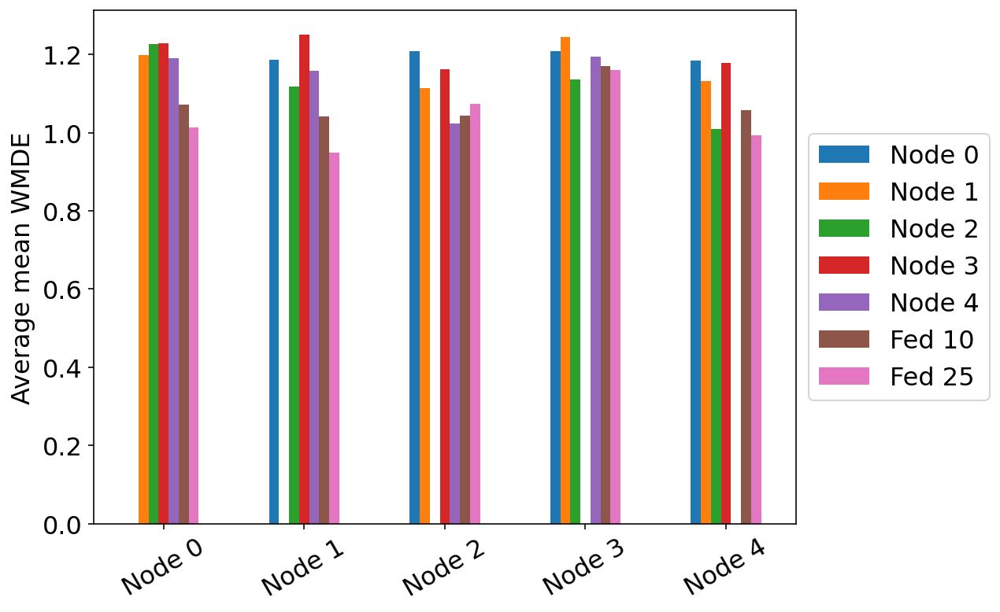

In [38]:
ax = df.plot.bar(rot=30)
ax.legend(loc='center left',bbox_to_anchor=(1.0, 0.5))
#ax.legend(bbox_to_anchor=(0.5, -0.5), loc='lower center', ncol=4)
ax.set_ylabel("Average mean WMDE")

# Esta es con 100 palabras

#color=['#07478F', '#8F180E', '#008E8E', '#8F600E', '#078F4', '#07C9DE', '#8A56B3']

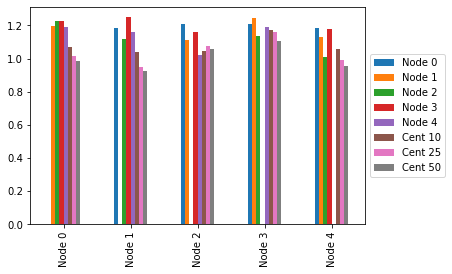

In [109]:
df.plot.bar().legend(loc='center left',bbox_to_anchor=(1.0, 0.5))
# Esta es con 15 palabras

## 10 words

In [52]:
n_words = 10
tfidf = True

distances = np.zeros((len(node_models), len(all_models)))

for idx_ref, ref_model in enumerate(node_models):
    this_topic_dst = []
    ref_topics = [el[1].split(', ') for el in TMmodel(ref_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
    for idx_comp, comp_model in enumerate(all_models):
        comp_topics = [el[1].split(', ') for el in TMmodel(comp_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
        all_dist = np.zeros((len(ref_topics), len(comp_topics)))
        for idx1,tpc1 in enumerate(ref_topics):
            for idx2,tpc2 in enumerate(comp_topics):
                all_dist[idx1,idx2] = model.wmdistance(tpc1[:n_words], tpc2[:n_words])
        distances[idx_ref, idx_comp] = np.mean(np.min(all_dist,axis=1))

# creating a list of index names
index_values = ['Node ' + str(el) for el in range(5)]

# creating a list of column names
column_values = index_values + ['Fed 10', 'Fed 25']

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:06.892476', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dict

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(9 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(9 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:06.945401', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora

INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:06.995611', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(9 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary l

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:07.062763', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['agriculture', 'airp

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.119820', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.175486', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.180044', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.231240', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle e

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.283055', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.286104', 'gensim': '4.0.1', 'python': '3.8.15 (default,

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.347648', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.464566', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', '

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:07.522106', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:07.578654', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.634150', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.685714', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 19 corpus positions)
IN

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:07.740177', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.744932', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.813372', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle e

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.865840', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.870559', 'gensim': '4.0.1', 'python': '3.8.15 (default,

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:07.931261', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:08.046444', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['calculus', 'cla

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:08.102017', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:08.158665', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:08.218362', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:08.279525', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:08.335661', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:08.340530', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:08.399355', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['error', 'force', 'measurement', 'plant', 'r

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:08.454469', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:08.511401', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:08.516065', 'gensim': '4.0.1', 'python': '3

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:08.564611', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['calculus

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 16 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 16 corpus positions)", 'datetime': '2022-10-26T23:34:08.680829', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 16 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 16 corpus positions)", 'datetime': '2022-10-26T23:34:08.733532', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T23:34:08.789804', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:08.793837', 'gensim': '4.0.1', 'py

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:08.845461', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 19 corpus positions)
IN

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:08.901937', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:08.962509', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle e

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:09.019785', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:09.076704', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['classification', 'color',

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:09.135933', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique token

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:09.249517', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:09.304256', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)", 'dateti

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:09.367097', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.cor

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:09.418782', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:09.480746', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:09.532556', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:09.537217', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:09.597122', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:09.649928', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classif

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:09.701917', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['a

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:09.838437', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique to

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:09.901508', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:09.958685', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.014450', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.019137', 'gensim': '4.0.1', 'py

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.071021', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.137340', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle e

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.197929', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.253842', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.314715', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.319384', 'gensim': '4.0.1', 'pytho

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.523080', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.527866', 'gensim': '4.0.1

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.581018', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['calculus', 'clause', 'compositional', 'expressive', 'notation']...) from 2 documents (total 20 corpus positions

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:10.636409', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:10.702834', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['attack', 'latency', 'network', 'node', 'packet']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lif

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:10.766572', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.cor

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:10.823587', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:10.875820', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['chaos', 'continuity', 'cutoff', 'delta', 'polar']...) from 2 documents (total 19 corpus positions)", 'dat

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.938042', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.942712', 'gensim': '4.0.1', 'py

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:10.999142', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agriculture', 'airport', 'compatible', 'favorite', 'harmful']...) from 2 documents (total 20 corpus positions)
INFO

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.056748', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.113820', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'chain', 'equilibrium', 'evolutionary', 'fuzzy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.178715', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.238734', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['gene', 'genome', 'level', 'process', 'protein']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.301169', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle e

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.353988', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['error', 'force', 'measurement', 'plant', 'robot']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.363045', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.424334', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.485374', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['child', 'education', 'grade', 'innovation', 'online']...) from 2 documents (total 19 corpus posit

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.547061', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(15 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.615795', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.620723', 'gensim': '4.0.1', 'python': '3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.680302', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classification', 'color', 'image', 'label', 'recognition']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.corpora.dictionary:built Dictionary(15 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(15 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.737060', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['a

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.796344', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['apparatus', 'comprise', 'connection', 'disclose', 'display']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.801117', 'gensim': '4.0.1', 'pytho

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.966500', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:11.971404', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.025295', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.085255', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'e

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:12.145130', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 18 

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:12.207444', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:ge

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:12.267150', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.326634', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.384543', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.445249', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.557017', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.561872', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.618668', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.676243', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.681002', 'gensim': '4.0.1', 'python': '3.8.15 (de

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:12.738667', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.794262', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.799111', 'gensim': '4.0.1', 'python': '3.8.15 (default,

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.854990', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['causality', 'convergence', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:12.913527', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:12.969060', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:13.027109', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:13.032027', 'gensim': '4.0.1', 'python':

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:13.145054', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:13.150017', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:13.210206', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:13.268126', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 19 corpus positions)
INFO:gensim.ut

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:13.328888', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['accompanying', 'dense', 'er

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:13.388700', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:13.393714', 'gensim': '4.0.1', 'python': '3.8.15 (default,

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:13.452733', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:13.511618', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:13.570624', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:13.630287', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 19 corpus positions)

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:13.740896', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'demo

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:13.800964', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:13.859417', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['austrian', 'egyptian', 'fol

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 16 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 16 corpus positions)", 'datetime': '2022-10-26T23:34:13.919511', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T23:34:13.976784', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gen

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.037404', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['causality', 'convergence', 

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:14.098762', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens:

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:14.152287', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.159245', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.210630', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.215454', 'gensim': '4.0.1', 'python':

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.330556', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.335512', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.395329', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.453968', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.512816', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 19 corpus po

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:14.577566', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:14.636801', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.698137', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "bu

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.755466', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.815630', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.948153', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:14.953141', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.012110', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.068579', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.073886', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.132202', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:15.191744', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Di

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.254393', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.312933', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:1

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.375469', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.427915', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.432545', 'gensim': '4.0.1', 'python':

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:15.646612', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'demo

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.701444', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['conflict', 'democracy', 'democratic', 'election', 'law']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['conflict', 'd

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.761427', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.816293', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agricultural', 'carbon', 'crop', 'electricity', 'emission']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.873638', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.878638', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['auction', 'bidding', 'experimental', 'game', 'inventory']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:15.936465', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auction', 'bidding', 'exper

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.994225', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:15.999369', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.054616', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.106329', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['austrian', 'egyptian', 'fold', 'kenyan', 'noteworthy']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.110944', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:16.170368', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['accompanying', 'dense', 'erratic', 'kenyan', 'overwhelm']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:16.227985', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.287494', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.346572', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['child', 'female', 'fertility', 'gender', 'immigrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.351793', 'gensim': '4.0.1', 'python': '3.8.15 (default,

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.410155', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.util

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:16.468768', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['causality', 'convergence', 'depreciation', 'euro', 'fdi']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['causality'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.535626', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.596379', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.656193', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cluster', 'entrepreneur', 'entrepreneurship', 'innovation', 'knowledge']...) from 2 documents

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.713631', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announceme

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.773265', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['announcement', 'beta', 'daily', 'derivative', 'dividend']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.779572', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:16.837368', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'di

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:16.897531', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['capital', 'change', 'different', 'important', 'investment']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.080527', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (t

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:17.136905', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.199262', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.259317', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 2

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.318588', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.376054', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['charact

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.434760', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus po

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.495762', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['brand', 'cognitive', 'c

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:17.559258', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.677403', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (t

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:17.738440', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.795033', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 do

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:17.852208', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.857202'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.916421', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.974549', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:17.980755', 'gensim': '4.0.1', 'python': '3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:18.037557', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'inter

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:18.094746', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['brand', 'cog

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:18.148712', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:18.153730', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:18.271218', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:18.2

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:18.328674', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:18.385946', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:18.443813', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 2

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:18.500526', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:18.559319', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['charact

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:18.614974', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 19 corpus position

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(9 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(9 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:18.678862', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:18.735571', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:18.794695', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['assembly', 'consolidation', 'constituenc

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 16 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 16 corpus positions)", 'datetime': '2022-10-26T23:34:18.902214', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T23:34:18.960432', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:19.017246', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cla

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:19.079511', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immig

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:19.137615', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:19.198035', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:19.260470', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:19.320135', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:19.381615', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['change', 'different', 'educ

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:19.494661', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:19.554624', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:19.610880', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:19.675036', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immig

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:19.732902', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:19.792791', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:19.851748', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:19.913143', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:19.968188', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:20.102342', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (t

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:20.160270', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 co

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:20.215443', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:20.275167', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dicti

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:20.337911', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:20.396067', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:20.400836', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oc

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:20.458999', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:20.523434', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:20.580189', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:20.585136', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:20.788504', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'e

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:20.845806', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['assembly', 'consolidation', 'constituency', 'criminology', 'execution']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:20.906621', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:20.965227', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['carrier', 'connotation', 'cultivation', 'harmonious', 'harmony']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:21.024272', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.083459', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.139938', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'government', 'international', 'law', 'legal']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique to

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.199059', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instructi

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.257266', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['classroom', 'competence', 'competency', 'engineering', 'instruction']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dicti

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.316080', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.320754', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.378679', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['household', 'housing', 'immigrant', 'income', 'migrant']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.433683', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.438623', 'gensim': '4.0.1', 'python': '3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.499137', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['character', 'christian', 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'christian', 'feminism', 'feminist', 'jewish']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.558724', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.563565', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.622045', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.683922', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catalog', 'consultant', 'date', 'email', 'handbook']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.690815', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oc

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:21.748181', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 'interior', 'interrupt']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:21.804257', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['coffee', 'crossing', 'hidden', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.869239', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.926773', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['brand', 'cognitive', 'communicative', 'game', 'linguistic']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.985050', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:21.990155', 'gensim': '4.0.1', 'python': '3.8.

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:22.048036', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'different', 'educ

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['change', 'different', 'education', 'important', 'people']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:22.104747', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle ev

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T23:34:22.264219', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:22.268669', 'gensim': '4.0.1', 'python': '3.8.1

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:22.319708', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']..

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:22.371869', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:22.436626', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 19 corpus positions)", '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:22.501749', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:22.559982', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:22.615932', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Di

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:22.680290', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:22.738075', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:22.742767', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T23:34:22.851187', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:22.907711', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:22.964284', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confoun

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:23.023735', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:23.087361', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:23.148250', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:23.206630', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Di

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:23.269236', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['character', 'come', 'critic', 'langua

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:23.328550', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:23.334549', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T23:34:23.447410', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist',

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:23.503955', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['agent', 'argument', 'ca

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:23.562551', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (to

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:23.622266', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonan

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:23.680824', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'e

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:23.740168', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus po

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:23.802079', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:23.861576', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 19 corpus position

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:23.926873', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T23:34:24.032186', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:24.084202', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:24.089053', 'gensim': '4.0.1', 'python':

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:24.142526', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:24.196737', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['a

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:24.255733', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'education',

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:24.315239', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique token

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(9 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:24.373559', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 18 corpus positions)",

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(9 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(9 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:24.433499', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:24.493658', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:24.553031', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionar

INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 16 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 16 corpus positions)", 'datetime': '2022-10-26T23:34:24.660641', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.u

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:24.719990', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confoun

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:24.778034', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonan

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:24.835966', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycl

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:24.894070', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:24.899060', 'gensim': '4.0.1', 'pytho

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:24.957313', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:25.016061', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus position

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:25.078573', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:25.137282', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:25.142098', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T23:34:25.271434', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:25.327314', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:25.385179', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (to

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:25.445229', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['a

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:25.509544', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:25.567744', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:25.625306', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus position

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:25.689931', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:25.752722', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T23:34:25.962470', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist', 'materialism']...) from 2 documents (total 17 corpus positions)", 'datetime': '2022-10-26T23:34:26.014687', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['como', 'este', 'freudian', 'marxist',

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.062831', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.074042', 'gensim': '4.0.1', 'python':

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.131467', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.190148', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['agent', 'argument', 'causal', 'epistemic', 'justification']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.195010', 'gensim': '4.0.1', 'python':

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:26.245413', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']..

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:26.305066', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['confound', 'indifference', 'optimism', 'reproducible', 'resistant']...) from 2 documents (to

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.368762', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.428032', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['auxiliary', 'consonant', 'diachronic', 'generative', 'hole']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.484335', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.489119', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cell', 'control', 'disease', 'education', 'field']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.548351', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cell', 'control', 'disease', 'education',

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.609911', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.668584', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['c

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.727513', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['concept', 'ethic', 'nature', 'philosopher', 'philosophical']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:26.732367', 'gensim': '4.0.1', 'pytho

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:26.796615', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:26.854564', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angel', 'enemy', 'epistle', 'fourteenth', 'hadith']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dicti

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:26.914838', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus position

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:26.979282', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['angle', 'chinese', 'connotation', 'dynasty', 'folk']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:27.038827', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:27.098559', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:27.103779', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oc

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:27.161590', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['character', 'come', 'critic', 'language', 'meaning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:27.220928', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:27.225882', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:27.284646', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['biblical', 'catholic', 'christian', 'church', 'faith']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:27.456451', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:27.516766', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
I

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:27.574667', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'an

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:27.633915', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:27.693805', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['curriculum', 'educati

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:27.752829', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:27.813102', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:27.871430', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dict

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:27.932659', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:28.046865', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.109111', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
I

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.166647', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.171603', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.223054', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:3

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.281040', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.2858

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.342501', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.396585', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.401313', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.464547', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['border', 'diplomacy', 'foreign'

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:28.526968', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:28.645343', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.705417', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.764469', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['advisor', 'announcement', 'ce

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:28.821869', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique token

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.882734', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (tota

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.942683', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.u

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:28.997294', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 19 cor

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:29.058214', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:29.063099', 'gensim': '4.0.1', 'python': '3.8.15 (de

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:29.117648', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:29.224567', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus po

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:29.284462', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:29.346915', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:29.406907', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique token

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:29.467682', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:29.528733', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'educati

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:29.588547', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:29.648137', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(17 unique tokens: ['border', 'diplomacy', 'foreig

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 16 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 16 corpus positions)", 'datetime': '2022-10-26T23:34:29.709822', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(9 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 18 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(9 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:29.821100', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:29.878757', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['campaign', 'candi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:29.934120', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:29.991845', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 docume

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.049865', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (tota

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.107382', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:ge

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.164463', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['care', 'climate', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.221073', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.228272', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(10 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(10 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.284017', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['border', 'diplomacy', 'foreign'

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:30.341316', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(9 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 18 corpus positions)
INFO:g

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:30.471210', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.ut

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.528007', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.532942', 'gensim': '4.0.1', 'python': '3

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.592478', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 docume

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.649857', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (tota

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.707483', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['c

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.767778', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.832305', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:30.892363', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'cultural', 'governmen

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(16 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(16 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:30.954494', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dic

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(18 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:31.162660', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inm

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:31.221772', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['affirm', 'disclose', 'fine', 'inmate', 'modification']...) from 2 documents (total 19 corpus positions)
INFO:gensim.ut

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:31.281771', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:31.343474', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['campaign', 'candidate', 'election', 'electoral', 'journalism']...) from 2 documents (total 20 corpus positions)
I

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:31.401102', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:31.406025', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['advisor', 'announcement', 'ceo', 'dearth', 'disconnect']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:31.465336', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['advisor', 'announcement', 'ce

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:31.523530', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:3

INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:31.582117', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:31.640591', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['catch', 'conceptualisation', 'contextualize', 'conversion', 'determined']...) from 2 docume

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:31.699608', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (tota

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:31.754677', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['cadre', 'connotation', 'countermeasure', 'countryside', 'cultivation']...) from 2 documents (tota

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:31.816011', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['c

INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:31.870684', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['curriculum', 'education', 'faculty', 'graduate', 'learning']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['c

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:31.942701', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:32.001069', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['care', 'climate', 'disaster', 'environmental', 'food']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:32.006945', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:32.063431', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:D

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:32.117505', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:32.122332', 'gensim': '4.0.1', 'python': '3.8.15 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['constitutional', 'judicial', 'justice', 'law', 'lawyer']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:32.183277', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Di

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:32.242885', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:32.248527', 'gensim': '4.0.1', 'python': '3.8.15 (de

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)", 'datetime': '2022-10-26T23:34:32.304209', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(20 unique tokens: ['border', 'diplomacy', 'foreign', 'military', 'nuclear']...) from 2 documents (total 20 corpus positions)
INFO:gensim.utils:Dict

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(18 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 18 corpus positions)", 'datetime': '2022-10-26T23:34:32.363460', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)", 'datetime': '2022-10-26T23:34:32.419954', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(19 unique tokens: ['change', 'cultural', 'government', 'important', 'people']...) from 2 documents (total 19 

In [ ]:
# creating the dataframe
df = pd.DataFrame(data = distances, 
                  index = index_values, 
                  columns = column_values)
print(df)

# Create plot
ax = df.plot.bar(rot=30,colormap='Accent')
#ax.legend(loc='center left',bbox_to_anchor=(1.0, 0.5))
ax.legend(bbox_to_anchor=(0.5, -0.5), loc='lower center', ncol=4)
ax.set_ylabel("Average min WMD")

## 50 words

In [10]:
n_words = 50
tfidf = True

distances = np.zeros((len(node_models), len(all_models)))

for idx_ref, ref_model in enumerate(node_models):
    this_topic_dst = []
    ref_topics = [el[1].split(', ') for el in TMmodel(ref_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
    for idx_comp, comp_model in enumerate(all_models):
        comp_topics = [el[1].split(', ') for el in TMmodel(comp_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
        all_dist = np.zeros((len(ref_topics), len(comp_topics)))
        for idx1,tpc1 in enumerate(ref_topics):
            for idx2,tpc2 in enumerate(comp_topics):
                all_dist[idx1,idx2] = model.wmdistance(tpc1[:n_words], tpc2[:n_words])
        distances[idx_ref, idx_comp] = np.mean(np.min(all_dist,axis=1))

# creating a list of index names
index_values = ['Node ' + str(el) for el in range(5)]

# creating a list of column names
column_values = index_values + ['Fed 10', 'Fed 25']

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(50 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(50 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:14.512970', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:addin

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(49 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(49 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:44:15.440257', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:44:16.309750', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(49 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:17.107443', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(85 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(85 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:18.000078', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['approximate', 'appro

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:18.909511', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 100 corpus positi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:19.803991', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)
INFO:gensi

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:20.707482', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:21.545170', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'ca

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:22.451481', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accord', 'alarm', 'apparatus', 'ass

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:23.460386', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['algebra', 'arabic', 'asserti

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:44:24.316648', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)"

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:25.285544', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:ge

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:26.208157', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:26.282694', 'gensim

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:27.141694', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 100 corpus positions)

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:28.093059', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)
INFO:gensim

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:29.072659', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:29.952147', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'ca

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:30.806216', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:30.880196', 'gensim': '4.0.1', 'python': '3.8.15 (default,

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:31.869748', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['algebra', 'arabic', 'asse

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:32.756424', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 97 corpus positions)"

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:44:33.765779', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:ge

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:44:34.710038', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 98 co

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:44:35.617771', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:44:36.637165', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['architecture', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:44:37.525929', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:37.624469', 'gensim': '4.0.1', 'python': '

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:38.507347', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:39.422400', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['3d', 'biometric', 'breast', 'ca

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:44:40.444994', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:44:41.433163', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 99 corpus positions)
INFO:gen

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:44:42.388820', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:44:43.270899', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['autocorrelation', 'bond', 'broken',

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:44.201573', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 uni

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:45.224584', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 100 corpus positions)
I

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:46.115796', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:46.191569', 'gensim': '4.

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:47.100650', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(92 unique tokens: ['barrier', 'care', 'chil

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:47.951847', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(92 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 92 corpus positions)
INFO:gens

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:48.844626', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 93 corpus positio

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:49.887453', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dicti

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:50.829973', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:51.738852', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 95 corpus positions)
INFO:gensim.utils

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:52.689919', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from

INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:44:53.620209', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique token

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:44:54.578120', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['architecture', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:55.527607', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)
INFO:gensi

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(86 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(86 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:56.481448', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:44:57.391412', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['3d', 'biometric', 'breast', 'ca

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:44:58.357512', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accord', 'alarm', 'apparatus', 'assembl

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:44:59.361672', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 100 corpus positions)
INFO:gensim.u

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:00.329034', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:01.277100', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['autocorrelation', 'bond', 'broken',

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:02.191266', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 100 corpus posi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:03.065808', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 100 corpus positio

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:03.932660', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)
INFO:gensim.

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:04.863244', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:05.809182', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['3d', 'biometric', 'breast', 'ca

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:06.779913', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accord', 'alarm', 'apparatus', 'assemb

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:07.835757', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 100 corpus positions)
INFO:gensim.u

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['algebra', 'arabic', 'assertion', 'bilingual', 'binding']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:08.813999', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['algebra', 'arabic', 'asse

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:09.814284', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:10.753375', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dicti

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:11.688046', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['attack', 'aware', 'bandwidth', 'cache', 'capacity']...) from 2 documents (total 99 corpus positions)"

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:45:12.797825', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:ge

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['autocorrelation', 'bond', 'broken', 'chaos', 'coder']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:45:13.710210', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['autocorrelation', 'bond', 'broken',

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:14.637815', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['adaption', '

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:45:15.575334', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['adaption', 'a

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['adaption', 'agriculture', 'airport', 'breakthrough', 'changing']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:16.467016', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:16.541042', 'gensim': '4.0.

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:17.337126', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:18.317998', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['approximate', 'approximation', 'auction', 'bidding', 'bind']...) from 2 documents (total 100 corpus positions)
I

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:19.188166', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:45:20.079856', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['architecture', 'automate', 'available', 'based', 'biological']...) from 2 docum

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:20.986422', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 100 corpus positions)
INFO:gensim.ut

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['aircraft', 'amplitude', 'angular', 'beam', 'calibration']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:45:21.939796', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['aircraft', 'amplitude', 'an

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:22.923629', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:23.900317', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['barrier', 'care', 'child', 'c

INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:45:24.780353', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['barrier', 'care', 'child', 'classroom', 'collaboration']...) from 2 documents (total 99 corpus positions)
INFO:gen

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:25.706196', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 99 corpus

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['3d', 'biometric', 'breast', 'cancer', 'classification']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:45:26.751501', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:27.635044', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:27.709037', 'gensim': '4.0.1', 'python': '3.8.15 (default,

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:28.526825', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:28.623797', 'gensim': '4.0.1', 'python': '3.8.15 (default, O

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:29.499827', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accord', 'alarm', 'apparatus', 'assembly', 'board']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lif

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:30.462181', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:30.572151', 

INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:31.427873', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['agent', 'auc

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:32.336417', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'aver

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 94 corpus positions)", 'datetime': '2022-10-27T12:45:33.242802', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 93 

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:34.216983', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:35.114816', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 98 corpus positio

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:36.007716', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:36.887465', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 document

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:37.854781', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:38.769683', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['account

INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 94 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 94 corpus positions)", 'datetime': '2022-10-27T12:45:39.720917', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:40.659868', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:41.600312', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:45:42.412611', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['accompanying', 'advisable',

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:43.242915', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)", 'dateti

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:44.173460', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique token

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(49 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(49 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:45.054390', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accounting', 'audit', 'board', 'bra

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:45.905164', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(50 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(50 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:46.001915', 'gensim': '4.0.1', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:46.837115', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(50 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(50 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:46.909756', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:3

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:47.805808', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:48.725715', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 99 corpus positions)"

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:49.732270', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:45:50.630431', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 93 corpus positions)
INFO:

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:51.471298', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lif

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:52.374766', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:53.289238', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 98 corpus posit

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:54.299844', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['abnormal', 'accura

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:55.223860', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:45:55.321331', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:56.249522', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:57.165993', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 99 corpus positions)
INFO:

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:45:58.184716', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:45:59.119472', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:45:59.999857', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 94 corpus positions)
INFO:

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:46:00.863410', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 99 corpus positions)", 'dateti

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:01.805264', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique token

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:02.692811', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accounting', 'audit', 'board', 'bra

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:46:03.668321', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 docume

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:46:04.646888', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.d

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:46:05.589999', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(83 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(83 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:46:05.678101', 'g

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:46:06.524877', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 100 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:46:07.451722', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['agent', 'auction', 'bidding', 'bundle', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:08.371874', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 98 corpus positions)", 'dateti

INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:46:09.298854', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:46:10.228794', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Di

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:46:11.159452', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 98 corpus positions)
INF

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:46:12.076058', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:13.000020', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']..

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:46:13.993729', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 10

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:46:14.858317', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['agricultural', 'agricul

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:15.724066', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle eve

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:16.660615', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 94 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 94 corpus positions)", 'datetime': '2022-10-27T12:46:17.598244', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 94 corpus positions)
INFO:

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:18.541413', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 99 corpus positions)", 'dateti

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:19.601354', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique token

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:20.568028', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accounting', 'audit', 'board', 'bra

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:21.514506', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['abnormal', 'accura

INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:46:22.406356', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['affect', 'asset', 'bank', 'capital', '

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:23.411472', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accoun

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:24.289168', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accountability', 'administration', 'agreement', 'american', 'anti']...) from 2 documents (to

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:46:25.234875', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 100 corpus positions)
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(70 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(70 unique tokens: ['agricultural', 'agriculture', 'air', 'animal', 'biofuel']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:46:26.187366', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['agricultural', 'agricultu

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:46:27.141537', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycl

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:46:28.043648', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle ev

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buyer']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:29.020206', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['agent', 'auction', 'bidding', 'bundle', 'buye

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:46:30.013550', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 99 corpus positions)", 'dateti

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['2nd', 'alarming', 'attest', 'austrian', 'avert']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:46:30.999301', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 94 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 94 corpus positions)", 'datetime': '2022-10-27T12:46:31.900826', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 94 corpus positions)
INFO:

INFO:gensim.corpora.dictionary:built Dictionary(87 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 91 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(87 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 91 corpus positions)", 'datetime': '2022-10-27T12:46:32.762964', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 94 corpus positions)
INFO:

INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 94 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['accompanying', 'advisable', 'alarming', 'attest', 'chip']...) from 2 documents (total 94 corpus positions)", 'datetime': '2022-10-27T12:46:33.590468', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 99 corpus positions)
INFO:gensim.ut

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:34.548142', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 98 corpus positions)", 'dateti

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['adult', 'attainment', 'birth', 'black', 'child']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:46:35.537752', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:36.527261', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['adjustment', 'appreci

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['adjustment', 'appreciation', 'asian', 'bilateral', 'causal']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:37.436135', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adjustment', 'appreci

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:38.335085', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accounting', 'audit', 'board', 'bra

INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:46:39.310291', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:46:40.189754', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accounting', 'audit', 'board', 'brand', 'capability']...) from 2 documents (total 99 corpus posit

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:46:41.120442', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['abnormal', 'acc

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['abnormal', 'accuracy', 'adjusted', 'announcement', 'anomaly']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:46:42.081196', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:46:43.016087', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']..

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:46:43.954822', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['affect', 'asset', 'bank', 'capital', 'change']..

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:45.052058', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.mo

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:45.961964', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:ge

INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:46:46.867705', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 99 corp

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:46:47.841826', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:46:48.812714', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.c

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:49.766966', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 99 corpus position

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:46:50.841970', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['anecdotal', '

INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:46:51.910445', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:52.803713', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['ad

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:46:53.680485', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 99 corpus posit

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:54.652959', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation'

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:55.551360', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 98 corpus posit

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:46:56.431966', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:46:57.391408', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(92 unique token

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:46:58.349710', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.c

INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 94 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 94 corpus positions)", 'datetime': '2022-10-27T12:46:59.328644', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:built Dictionary(92 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 92 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(92 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 92 corpus positions)", 'datetime': '2022-10-27T12:47:00.285470', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 97 co

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(90 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 91 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(90 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 91 corpus positions)", 'datetime': '2022-10-27T12:47:01.195591', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['amplify', 'band', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 94 corpus positions)", 'datetime': '2022-10-27T12:47:02.056659', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'bra

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:03.073787', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:ge

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:03.919468', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:04.775631', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:ge

INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:47:05.680266', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 98 corp

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:06.530412', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique token

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:07.395720', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.c

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(50 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:47:08.373521', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 98 corpus positio

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(48 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(48 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:47:09.295231', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 95 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 95 corpus positions)", 'datetime': '2022-10-27T12:47:10.129217', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:10.998800', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adv

INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:47:11.883325', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:47:12.752831', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['aggre

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:47:13.613050', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(88 unique tokens: ['absorb', 'abundant', 'adhere', 'ang

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:14.576501', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 99 corpus p

INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:47:15.480097', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) fr

INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:47:16.400855', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictiona

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:17.449487', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(86 unique tokens: ['african', 'artist', 'black', 'century

INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:47:18.305900', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 98 co

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:47:19.223669', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['amplify', 'band', '

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:20.199827', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adv

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:21.064171', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:22.029281', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:22.921178', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:ge

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(79 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:47:23.828868', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:47:23.886878', 'gensim': '4.0.1

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:24.661097', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:25.662345', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.c

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:26.621182', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:47:27.572755', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:47:28.439879', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:29.292250', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:30.392652', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respe

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:31.357172', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:ge

INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:47:32.343281', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 uniqu

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:33.232963', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:34.182270', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.c

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:47:35.114822', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:47:35.190443', 'gensim': '4.0.1', 'python': '3.8.15 (defau

INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:36.057785', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 97 co

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:47:37.040462', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['amplify', 'band', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:47:37.894095', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'b

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:38.866562', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:ge

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:47:39.940860', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:40.876131', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['aggression', 'assembly', 'bureaucracy', 'coercion', 'consolidation']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:41.768996', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:42.760767', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['absorb', 'abundant', 'adhere', 'ang

INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:43.685781', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['absorb', 'abundant', 'adhere', 'angle', 'atmosphere']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:47:44.627527', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['agreement', 'authority', 'campaign', 'citizen', 'citizenship']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:47:45.570021', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['agreement', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:46.472720', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:47:47.391464', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique token

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['administrator', 'assessment', 'assignment', 'classroom', 'collaboration']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:47:48.272019', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:49.192191', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.c

INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:50.113163', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['adolescent', 'adult', 'capital', 'care', 'couple']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictiona

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:47:51.110003', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:47:52.057726', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['african', 'artist', 'black', 'centur

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['african', 'artist', 'black', 'century', 'character']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:53.064128', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['african', 'artist', 'black', 'centur

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:47:53.990307', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['anecdotal', 'aspirational', 'author', 'bibliometric', 'catalog']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:47:54.862647', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 95 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 95 corpus positions)", 'datetime': '2022-10-27T12:47:55.774543', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:47:56.636545', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['amplify', 'band', 'biographical', 'borderland', 'capitalize']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:47:57.448917', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:58.279037', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:47:58.389

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'brand']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:47:59.303200', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:00.251725', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:48:01.206976', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['activity', 'change', 'child', 'consider', 'cultural']...) from 2 documents (total 99 corpus posit

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 7 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:48:02.300188', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gen

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:03.152474', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.cor

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:48:04.052703', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 97 corpus positions)
INFO:gen

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:05.014959', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 docum

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:05.912137', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 98 corpus positions)", 'datetime'

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:06.874860', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:48:07.793576', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 document

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:48:08.764252', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (tot

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:09.720130', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['appear', 'artist', 'character', 'come', 'c

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:48:10.701837', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 100 corpus positions)
I

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(92 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 92 corpus positions)", 'datetime': '2022-10-27T12:48:11.598207', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 7 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(87 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 87 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(87 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'ca

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:48:12.514802', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 93 corpus positions)", 'dat

INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(91 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 92 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(91 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 92 corpus positions)", 'datetime': '2022-10-27T12:48:13.476164', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:48:14.436667', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:48:15.325234', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:16.237628', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:48:17.180040', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accusation', 'angel

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:48:18.135601', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['affection', 'angle', 'a

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:19.090424', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.cor

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:20.075076', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['authority', 'believe

INFO:gensim.models.keyedvectors:Removed 7 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(88 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 90 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(88 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 90 corpus positions)", 'datetime': '2022-10-27T12:48:20.972360', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 7 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dic

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:48:21.891794', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'ca

INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 95 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 95 corpus positions)", 'datetime': '2022-10-27T12:48:22.773591', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 98 corpus positions)
INFO:gen

INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:48:23.731505', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 99 corpus p

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:48:24.630845', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 99 corpus positions)", 'datetime'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:48:25.637635', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['con

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:48:26.517336', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:27.477808', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:28.452002', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.cor

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:29.353709', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 7 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(43 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 86 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(43 unique tokens: ['

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:48:30.193885', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(92 unique tokens: [

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:31.043335', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(91 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 91 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(91 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 91 corpus pos

INFO:gensim.models.keyedvectors:Removed 1 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(92 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 92 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(92 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 92 corpus positions)", 'datetime': '2022-10-27T12:48:32.019249', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 1 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(92 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 92 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(92 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 92 corpus positions)", 'datetime': '2022-10-27T12:48:32.873478', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:48:33.711891', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique'

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:48:34.729533', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:48:35.607788', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:36.445672', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.cor

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:48:37.425141', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique token

INFO:gensim.corpora.dictionary:built Dictionary(89 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 89 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(89 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 89 corpus positions)", 'datetime': '2022-10-27T12:48:38.344552', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 7 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(91 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 d

INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 95 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 95 corpus positions)", 'datetime': '2022-10-27T12:48:39.191265', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.cor

INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 94 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 94 corpus positions)", 'datetime': '2022-10-27T12:48:40.154455', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 96 corpus positions)
INFO:gen

INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 95 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 95 corpus positions)", 'datetime': '2022-10-27T12:48:41.063658', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 97 corpus p

INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 95 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 95 corpus positions)", 'datetime': '2022-10-27T12:48:41.985039', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecy

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:48:42.992098', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['conc

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:48:43.870294', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 document

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:48:44.770832', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (tot

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:48:45.836350', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifec

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:48:46.794442', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['authority', 'beli

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:48:47.743876', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 7 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(92 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:48.699233', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'ca

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:48:49.701768', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 97 corpus positions)
INFO:gen

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:50.730336', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 98 corpus p

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:51.698781', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 98 corpus positions)", 'datetime'

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:48:52.686436', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['conc

INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:48:53.636164', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 98 corpus posi

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:48:54.628827', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 99 corpus positions)

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:48:55.609271', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifec

INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:48:56.510046', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique toke

INFO:gensim.models.keyedvectors:Removed 7 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(92 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 92 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(92 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 92 corpus positions)", 'datetime': '2022-10-27T12:48:57.534455', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 7 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dic

INFO:gensim.models.keyedvectors:Removed 7 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(92 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 92 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(92 unique tokens: ['alienation', 'alterity', 'anthropological', 'capitalism', 'capitalist']...) from 2 documents (total 92 corpus positions)", 'datetime': '2022-10-27T12:48:58.402076', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 7 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dic

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:48:59.335189', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.cor

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:00.320540', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:49:01.284094', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['agent', 'appeal', 'argument', 'belief', 'causal']...) from 2 documents (total 99 corpus positions)", 'dat

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:49:02.328476', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['affirmative', 'arrow', 'bypass', 'caricature', 'concur']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:49:03.268205', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['affirmative', 'arrow', 'bypas

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:04.252416', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accounting', 'adj

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:49:05.244114', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accounting', 'adjective', 'adverb', 'anomaly', 'assimilation']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:06.174584', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:07.190795', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecy

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['biology', 'care', 'cell', 'change', 'chemical']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:49:08.213464', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:49:09.184649', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['c

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:49:10.099619', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['concept', 'conception', 'consciousness', 'contemporary', 'critique'

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:49:11.198621', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:49:12.163460', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accusation', 'angel', 'announcement', 'bless', 'celebration']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:49:13.044538', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:49:14.060730', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['affection', 'angle', 'artistic', 'atmosphere', 'beautiful']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:49:15.044894', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:49:15.902920', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 98 corpus positions)", 'd

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:49:16.871988', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 97 corpus positions)", 'd

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['appear', 'artist', 'character', 'come', 'critic']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:49:17.862354', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dicti

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:18.792096', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['authority', 'believe

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:49:19.745649', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['authority', 'believer', 'biblical', 'catholic', 'christian']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:49:19.847936', 'gensim': '4.0.1', 'pyt

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:20.874782', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.c

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:21.811065', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 95 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 95 corpus positions)", 'datetime': '2022-10-27T12:49:22.740033', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['advisor', 'affili

INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:49:23.656198', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Di

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:24.616021', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accumulate', 'athlete', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:49:25.566130', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adaptat

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:49:26.435295', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['abuse', 'act',

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:49:27.377343', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:49:28.329427', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['activity', 'change', 'concept', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:29.281371', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accident', 'advise', 'affirm', 'antitrust

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:49:30.225371', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['activism', 'activis

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:49:31.151655', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 95 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 docum

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:49:32.072379', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 97 corpus position

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:33.096663', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 94 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 94 corpus positions)", 'datetime': '2022-10-27T12:49:34.083468', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(91 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 91 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(91 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 91 corpus positions)", 'datetime': '2022-10-27T12:49:35.013054', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['adaptation', 'a

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 94 corpus positions)", 'datetime': '2022-10-27T12:49:35.887838', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 docum

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:36.888990', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 doc

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:49:37.905576', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:49:38.870667', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['accident', 'advise', 'affirm', 'antitrust

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:49:39.803485', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (tot

INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(91 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(91 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:49:40.814592', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 95 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 95 corpus positions)", 'datetime': '2022-10-27T12:49:41.716087', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['ambivalence', 'ample', 'assemble', 'b

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:49:42.635177', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:49:42.727983', 'gensim': '4.0.1', 'python': 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:49:43.645370', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['accredi

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:49:44.505734', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:49:45.419645', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 99 corp

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:46.440191', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionar

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(70 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(70 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:49:47.415230', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 1 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionar

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:48.323125', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils

INFO:gensim.models.keyedvectors:Removed 4 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(89 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 89 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(89 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 89 corpus positions)", 'datetime': '2022-10-27T12:49:49.362366', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 2 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(91 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 91 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(91 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 91 corpus positions)", 'datetime': '2022-10-27T12:49:50.245714', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(93 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 93 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(93 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:49:51.205944', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accumulate', 'athlete', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(92 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 93 corpus positions)", 'datetime': '2022-10-27T12:49:52.123539', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) fro

INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:49:53.157286', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:54.066631', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:49:55.028116', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T1

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:49:56.043337', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['activity', 'change', 'concept', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 95 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 95 corpus positions)", 'datetime': '2022-10-27T12:49:56.963339', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accident', 'advise', 'affirm', 'antitrust

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:49:57.873785', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (tot

INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(89 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 94 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(89 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 94 corpus positions)", 'datetime': '2022-10-27T12:49:58.798258', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(48 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(48 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:49:59.731606', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:50:00.622295', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(50 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(50 unique tokens: ['accumu

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:01.557155', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(50 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 100 corpu

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:50:02.379499', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 do

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:03.334184', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['abuse', 'act'

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:50:04.256158', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 do

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:50:05.150751', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 99 corpus po

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:50:06.234771', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.c

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:07.172809', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 100 corpus positions)
INFO

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:50:08.055984', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['advisor', 'affili

INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:50:09.056435', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Di

INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:09.983643', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tok

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:50:10.878877', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:11.837686', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 100 corpus positi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:12.740726', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "b

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:50:13.658556', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 98 corpus positions)
INFO:gensim.ut

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:50:14.739617', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictiona

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:50:15.699007', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 99 corpus positions)", '

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accident', 'advise', 'affirm', 'antitrust', 'bar']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:50:16.716892', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.c

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:17.619398', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['activism', 'activis

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:50:18.487285', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (tot

INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:50:19.461395', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['advisor', 'affiliate', 'announcement', 'antecedent', 'author']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:50:20.365230', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:50:21.259567', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:50:22.193438', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['ambivalence', 'ample', 'assemble', 'b

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:50:23.111621', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['ambivalence', 'ample', 'assemble', 'broker', 'bulk']...) from 2 documents (total 98 corpus position

INFO:gensim.corpora.dictionary:built Dictionary(86 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(86 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:24.040154', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 98 corpus positions)


INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accumulate', 'athlete', 'athletic', 'attraction', 'cadre']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:50:24.968749', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:50:25.883650', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accreditat

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:50:26.810755', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['accreditat

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['accreditation', 'administrator', 'campus', 'career', 'classroom']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:27.708443', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 97 corpus positions)", 'datetime': '2022-10-27T12:50:28.571703', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(94 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 96 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(94 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 do

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 96 corpus positions)", 'datetime': '2022-10-27T12:50:29.398829', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(95 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 documents (total 95 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(95 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'capacity', 'care']...) from 2 do

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:30.292821', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 100 corpus positi

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 98 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['abuse', 'act', 'administrative', 'constitutional', 'contract']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:50:31.230784', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:32.187949', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2

INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:33.122370', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 100 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['alliance', 'arab', 'arm', 'armed', 'army']...) from 2 documents (total 100 corpus positions)", 'datetime': '2022-10-27T12:50:34.063858', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural'

INFO:gensim.corpora.dictionary:built Dictionary(99 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 99 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(99 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 99 corpus positions)", 'datetime': '2022-10-27T12:50:35.005569', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 98 corpus positions)
INFO:gensim.ut

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 98 corpus positions)", 'datetime': '2022-10-27T12:50:35.937460', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(97 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 97 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(97 unique tokens: ['activity', 'change', 'concept', 'country', 'cultural']...) from 2 documents (total 97 corpus po

          Node 0    Node 1    Node 2    Node 3    Node 4    Fed 10    Fed 25
Node 0  0.000000  1.146970  1.157048  1.166549  1.156837  0.996995  0.895584
Node 1  1.125352  0.000000  1.059043  1.160627  1.064920  0.923063  0.779705
Node 2  1.135195  1.039879  0.000000  1.082354  0.880270  0.917637  0.924352
Node 3  1.167814  1.165804  1.056420  0.000000  1.152469  1.073777  1.034827
Node 4  1.152722  1.054931  0.868934  1.131499  0.000000  0.962060  0.900765


Text(0, 0.5, 'Average min WMD')

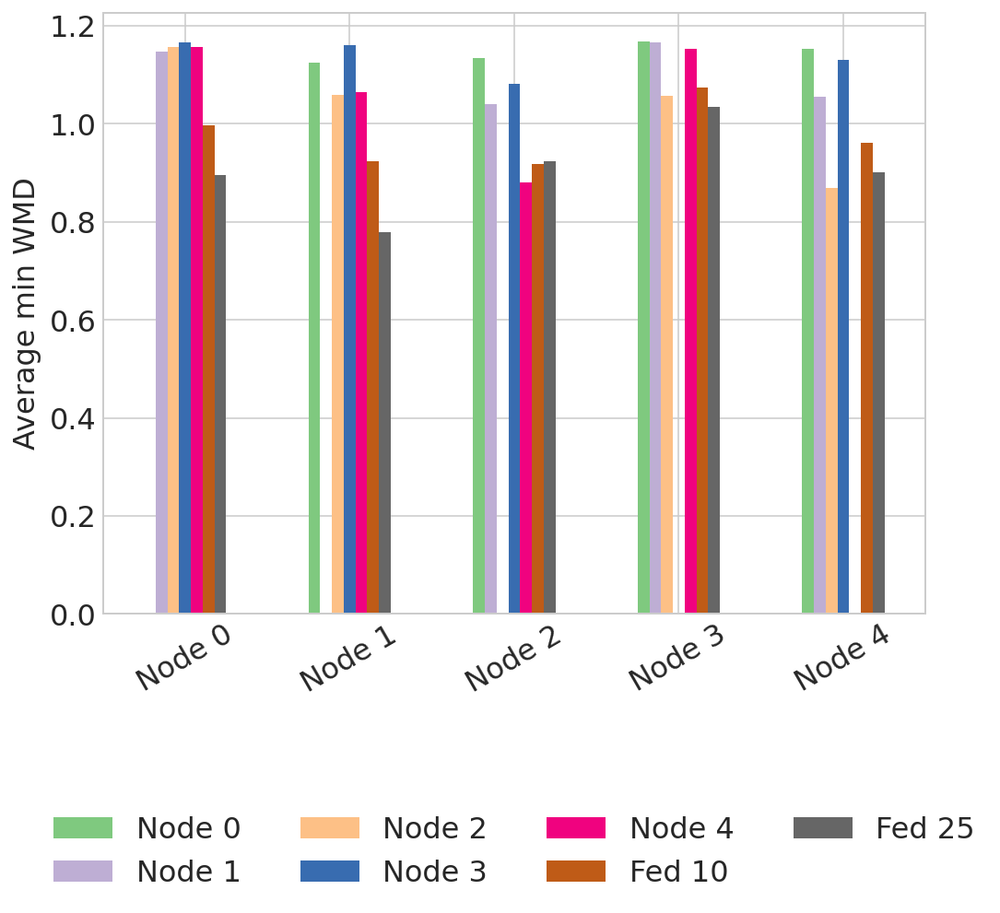

In [11]:
# creating the dataframe
df = pd.DataFrame(data = distances, 
                  index = index_values, 
                  columns = column_values)
print(df)

# Create plot
ax = df.plot.bar(rot=30,colormap='Accent')
#ax.legend(loc='center left',bbox_to_anchor=(1.0, 0.5))
ax.legend(bbox_to_anchor=(0.5, -0.5), loc='lower center', ncol=4)
ax.set_ylabel("Average min WMD")

Text(0, 0.5, 'Average min WMD')

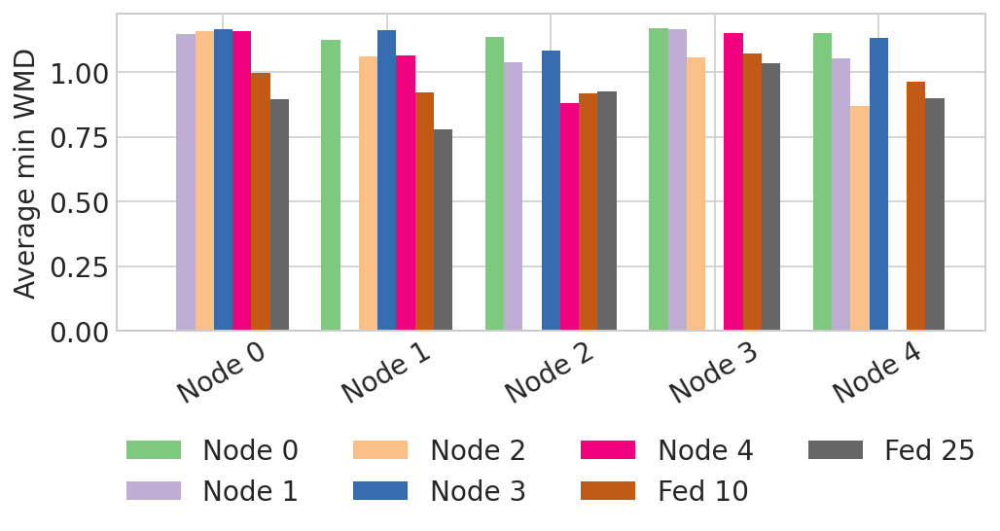

In [17]:
plt.rcParams['figure.figsize'] = [8, 3]
plt.rcParams.update({'font.size': 14})

ax = df.plot(kind='bar', rot=30, width=0.8, colormap='Accent')

#ax.legend(loc='center left',bbox_to_anchor=(1.0, 0.5))
ax.legend(bbox_to_anchor=(0.5, -0.63), loc='lower center', ncol=4, fontsize=14)
ax.set_ylabel("Average min WMD")

## 100 words

In [83]:
n_words = 100
tfidf = True

distances = np.zeros((len(node_models), len(all_models)))

for idx_ref, ref_model in enumerate(node_models):
    this_topic_dst = []
    ref_topics = [el[1].split(', ') for el in TMmodel(ref_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
    for idx_comp, comp_model in enumerate(all_models):
        comp_topics = [el[1].split(', ') for el in TMmodel(comp_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
        all_dist = np.zeros((len(ref_topics), len(comp_topics)))
        for idx1,tpc1 in enumerate(ref_topics):
            for idx2,tpc2 in enumerate(comp_topics):
                all_dist[idx1,idx2] = model.wmdistance(tpc1[:n_words], tpc2[:n_words])
        distances[idx_ref, idx_comp] = np.mean(np.min(all_dist,axis=1))

# creating a list of index names
index_values = ['Node ' + str(el) for el in range(5)]

# creating a list of column names
column_values = index_values + ['Fed 10', 'Fed 25']

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:52:34.701907', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyed

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:52:39.151242', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-26T23:52:43.548113', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:52:47.715969', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-26T23:52:51.584931', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 doc

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:52:56.079739', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) f

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:53:00.586299', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-26T23:53:04.712449', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 193 corpus positions)"

INFO:gensim.models.keyedvectors:Removed 3 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 191 corpus positions)", 'datetime': '2022-10-26T23:53:09.840862', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:53:14.297598', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['accord', 'accordance', 'alar

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-26T23:53:18.384837', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-26T23:53:23.258007', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from

INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-26T23:53:27.969132', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 document

INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:53:32.040933', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 198

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(175 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:53:36.443300', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 doc

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:53:41.083932', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:53:45.534303', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 doc

INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-26T23:53:50.725819', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 191 corpus positions)", 'datetime': '2022-10-26T23:53:55.354472', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['3d', 'adversaria

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:54:00.073531', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 199 cor

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-26T23:54:04.684194', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-26T23:54:09.248795', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-26T23:54:14.205164', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:54:18.553862', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:54:23.341808', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:54:28.051735', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:54:32.668191', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['acceleration',

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:54:37.260524', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 193 corpus positions)"

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:54:41.927131', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 docume

INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:54:47.288312', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.models.keyedvectors:Removed 2 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:54:51.694765', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:54:56.119549', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 6 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(189 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 190 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(189 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 190 corpus positions)", 'datetime': '2022-10-26T23:55:00.646402', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:55:05.505674', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 191 corpus positions)", 'datetime': '2022-10-26T23:55:09.872708', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['algebraic', 'a

INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:55:14.772248', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:55:19.473717', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['acceleration',

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-26T23:55:23.452789', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 195 corpus positions)"

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-26T23:55:28.389265', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 docume

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:55:33.255790', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 196 cor

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:55:38.291131', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:55:42.887052', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:55:47.384736', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:55:52.206495', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['adaption',

INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-26T23:55:56.585791', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:56:01.387188', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abstract

INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:56:06.129871', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 198 corpu

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:56:10.223941', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 197 corpus positions)"

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-26T23:56:14.724906', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 docume

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:56:19.676145', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:56:24.541558', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:56:29.206324', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:56:34.125097', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:56:38.647203', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 199

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(177 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(177 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-26T23:56:43.466903', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['algebraic', 'a

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:56:48.057413', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(160 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(160 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) f

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:56:52.800686', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:56:57.249044', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['3d', 'adversarial', 'alignment', 'anat

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:57:01.845801', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 200 corpus positions)
INFO:ge

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:57:06.876131', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively)

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:57:11.929895', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['abstraction', 'algebra', 'analogy', 'arabic', 'argumentation']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:57:16.515999', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-26T23:57:21.509160', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['access', 'adversary', 'allocate', 'allocation', 'architecture']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:57:26.092181', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:57:30.757694', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-26T23:57:35.296672', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.models.keyedvectors:Removed 6 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 190 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['abrupt', 'accumulative', 'altered', 'amplification', 'appreciable']...) from 2 documents (total 190 corpus positions)", 'datetime': '2022-10-26T23:57:39.817502', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:57:44.352158', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:57:48.510659', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(186 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(186 unique tokens: ['adaption', 'agriculture', 'airport', 'altered', 'breakthrough']...) from

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:57:53.295558', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-26T23:57:57.949635', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['algebraic', 'ant', 'approximate', 'approximation', 'auction']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-26T23:58:02.756327', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-26T23:58:07.409954', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['abstract

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:58:11.438440', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['abstraction', 'action', 'activity', 'architecture', 'attribute']...) f

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:58:16.000264', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['acceleration',

INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:58:20.424500', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique t

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:58:24.595588', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['acceleration', 'active', 'actuator', 'aircraft', 'amplitude']...) from 2 doc

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:58:29.230235', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-26T23:58:33.951282', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['adult', 'agency', 'app', 'attitude', 'awareness']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dicti

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:58:38.057421', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 docume

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-26T23:58:42.510489', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 docume

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:58:47.396199', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['3d', 'adversarial', 'alignment', 'anatomical', 'appearance']...) from 2 docume

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(156 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(156 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:58:52.375499', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accord', 'accordance', 'alar

INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['accord', 'accordance', 'alarm', 'analog', 'apparatus']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-26T23:58:56.763125', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['accord', 'accordance', 'alar

INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:59:01.338135', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Di

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:59:05.722769', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:59:06.033681', 'gensim

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:59:10.754944', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-26T23:59:15.220210', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-26T23:59:19.827930', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:59:24.789366', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(188 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black

INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-26T23:59:29.330857', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 194 corpus positions)
IN

INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:59:34.314788', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(173 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 198 corpus p

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:59:39.039960', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-26T23:59:43.766235', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['activity', 'affect', 'asset', 'avail

INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:59:48.224864', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Di

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:59:52.460499', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-26T23:59:52.786265', 'gensim

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-26T23:59:56.809390', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:00:01.347719', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:00:05.547258', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:00:10.050885', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dict

INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:00:14.477604', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 199 corpus positions

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:00:18.858013', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 200 corpus positions)
INFO

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:00:23.460312', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary li

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:00:28.229451', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(151 unique tokens: ['

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:00:32.888225', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['abatemen

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:00:37.709419', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['advertising', 'agent', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:00:41.906699', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['2nd', 'aba

INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:00:46.457674', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:00:50.842593', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:00:55.184118', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 195 corpus positions)
IN

INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:00:59.942116', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 199 corpus p

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:01:04.428895', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 200 corpus positions)
INFO:gensi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:01:09.064964', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:01:09.607171', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oc

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:01:14.068483', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:01:18.494965', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:01:23.166289', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['advertising', 'agent', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:01:27.668504', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['2nd', 'aba

INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(187 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(187 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:01:31.783500', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:01:36.491825', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:01:40.888245', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 194 corpus positions)
IN

INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:01:45.608364', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 198 corpus p

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:01:50.034430', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['abnormal', 'accrual', 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:01:54.538697', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 199 corpus position

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:01:59.414607', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:02:04.080678', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:02:08.766887', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(189 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(189 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:02:13.133094', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 6 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(188 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(188 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 191 corpus positions)", 'datetime': '2022-10-27T00:02:17.610514', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:02:22.119173', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:02:26.259278', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 1

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:02:30.902046', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 docume

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:02:35.533871', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:02:40.208391', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 199 corpus position

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(149 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(149 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:02:45.492080', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['

INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:02:50.174811', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(162 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 

INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:02:54.485326', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 198 corpus positions)
IN

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:02:58.816169', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['2nd', 'aba

INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:03:03.751367', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:03:08.437608', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(181 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black

INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:03:13.111992', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(179 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 194 corpus positions)
IN

INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:03:17.847894', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 198 corpus p

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:03:22.250805', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (tota

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:03:26.995391', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:03:31.551713', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:03:35.614704', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administrative']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['accountability', 'act', 'actor', 'administration', 'administra

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:03:40.573358', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['abatemen

INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:03:44.995411', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:03:49.112392', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['abatement', 'adaptation', 'agricultural', 'agriculture', 'agro']...) f

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:03:53.655787', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['advertising', 'agent', 'algorithm', 'ambiguity', 'ante']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:03:58.571097', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:04:03.083821', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:04:07.737633', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'advisable']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:04:12.237059', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 un

INFO:gensim.models.keyedvectors:Removed 6 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 191 corpus positions)", 'datetime': '2022-10-27T00:04:17.001438', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['ac', 'accompanying', 'activate', 'advisable', 'alarming']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:04:21.326424', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:04:26.167948', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(139 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:04:30.482962', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 193 corpus positions)", 'dateti

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['adult', 'age', 'attainment', 'birth', 'black']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:04:35.434906', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpo

INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:04:40.127878', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accumulation', 'adjustment', 'african', 'aid', 'anchor']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:04:45.046810', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:04:50.055028', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:04:54.409811', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['accounting', 'acquisition', 'alliance', 'attitude', 'audit']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:04:58.798983', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['abnormal', 'accr

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:05:03.265981', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (tota

INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:05:07.895321', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abnormal', 'accrual', 

INFO:gensim.models.keyedvectors:Removed 0 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:05:12.730479', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['activity', 'affect', 'asset', 'available', 'bank']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:05:17.252601', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:05:21.220212', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 198 corpus positions)
INFO:gensim.ut

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:05:26.158646', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:05:30.985534', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:05:31.488912', '

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:05:35.373483', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:05:39.950874', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:05:45.091413', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:05:49.771004', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:05:54.354148', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:05:59.190861', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:06:03.674999', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['accord', 'achieve', 'activity'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:06:08.589319', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['affirmative', 'aggression', 'all

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:06:13.206853', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['absorb', 'ab

INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:06:17.293307', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (

INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:06:22.041898', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (tot

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:06:26.863320', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['adolescent', 'adult', 'a

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:06:31.376295', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['activist', 'african', 'america

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(189 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(189 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:06:36.018803', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(186 unique tokens: ['accrue', 'an

INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:06:40.506950', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:06:44.694028', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding do

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:06:49.354130', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:06:53.580224', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:06:57.855288', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:07:02.112331', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(98 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(98 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:07:06.829364', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:07:11.166984', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:07:15.460841', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:07:19.979424', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:07:24.131749', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:07:28.409509', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding do

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(189 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(189 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:07:33.126229', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:07:37.231259', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:07:41.799167', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:07:46.288522', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:07:50.491646', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:07:54.742672', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:07:59.277425', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:08:03.187434', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:08:07.693309', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:08:12.664170', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding do

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:08:17.307053', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:08:21.739941', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:08:26.387505', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:08:30.525250', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:08:35.259738', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:08:39.776585', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:08:44.176846', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 6 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(188 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(188 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 191 corpus positions)", 'datetime': '2022-10-27T00:08:48.308210', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 6 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(185 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(185 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 191 corpus positions)", 'datetime': '2022-10-27T00:08:52.796806', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:08:57.450832', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding do

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:09:02.234859', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:09:06.456679', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:09:11.188225', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:09:15.561085', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:09:20.012223', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:09:24.580014', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:09:29.170213', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(189 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(189 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:09:33.630808', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:09:38.496966', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:09:43.086844', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding do

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:09:47.904199', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:09:52.645004', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:09:57.352385', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['affirmative', 'aggression', 'all

INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:10:01.889911', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['affirmative', 'aggression', 'allege', 'arm', 'army']...) from 2 documents (total 198 corpus positions)
INFO:gensim.ut

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:10:06.192269', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['absorb', 'ab

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'adhere']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:10:11.113824', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:10:15.161009', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['admi

INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:10:19.684641', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (

INFO:gensim.corpora.dictionary:built Dictionary(184 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(184 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:10:24.087819', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['administration', 'administrative', 'affair', 'agreement', 'armed']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictiona

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:10:28.798795', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['admini

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['administrator', 'assessment', 'assignment', 'based', 'bilingual']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:10:33.309381', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:10:38.201813', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:10:42.679917', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['adolescent', 'adult', 'association', 'average', 'birth']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:10:47.450493', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(174 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(174 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:10:51.716772', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['activist', 'african', 'america

INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:10:56.727544', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['activist', 'african', 'american', 'artist', 'belief']...) from 2 documents (total 198 corpus positions)
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 191 corpus positions)", 'datetime': '2022-10-27T00:11:01.042183', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 193 co

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:11:05.763825', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(182 unique tokens: ['accrue', 'an

INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['accrue', 'anecdotal', 'articulated', 'aspirational', 'author']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:11:10.129605', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 6 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 191 corpus positions)", 'datetime': '2022-10-27T00:11:14.612090', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['adventure', 'ambivalence', 'amplify', 'anthology', 'articulated']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:11:18.957323', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:11:23.708935', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding do

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:11:28.500788', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['advertising', 'analytical', 'architectural', 'architecture', 'argumentation']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:11:32.868529', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:11:36.994833', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['accord', 'achieve', 'activity'

INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:11:42.022554', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['accord', 'achieve', 'activity', 'attention', 'build']...) from 2 documents (total 198 corpus positions)
INFO:gensim

INFO:gensim.models.keyedvectors:Removed 11 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(189 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 189 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(189 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 189 corpus positions)", 'datetime': '2022-10-27T00:11:46.093647', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:add

INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:11:50.326560', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:11:54.699224', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:11:59.749735', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:12:04.612777', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:12:08.905800', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['absolute', 'anth

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:12:13.925020', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['accusation', 'acquaint', 'addres

INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:12:18.300928', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 191 corpus positions)
INFO:gensim.ut

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:12:23.070537', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 195 corpus position

INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:12:27.752332', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['african', 'authority

INFO:gensim.models.keyedvectors:Removed 11 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(183 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 183 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(183 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 183 corpus positions)", 'datetime': '2022-10-27T00:12:32.051768', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:add

INFO:gensim.models.keyedvectors:Removed 6 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(188 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 188 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(188 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 188 corpus positions)", 'datetime': '2022-10-27T00:12:36.484453', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(187 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(187 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:12:40.870816', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:12:45.710058', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:12:50.190924', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:12:54.430065', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['absolute', 'anth

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 190 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 190 corpus positions)", 'datetime': '2022-10-27T00:12:59.163184', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accusation', 'acquaint', 'addres

INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 190 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 190 corpus positions)", 'datetime': '2022-10-27T00:13:03.523681', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 195 corpus positions)
INFO:gensim.ut

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:13:08.416508', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:13:13.290814', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique token

INFO:gensim.models.keyedvectors:Removed 11 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(183 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 183 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(183 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 183 corpus positions)", 'datetime': '2022-10-27T00:13:17.613435', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:add

INFO:gensim.models.keyedvectors:Removed 6 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(188 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 188 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(188 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 188 corpus positions)", 'datetime': '2022-10-27T00:13:22.052784', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:13:26.043314', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:13:30.727838', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:13:35.103599', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:13:39.186844', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 4 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 190 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 190 corpus positions)", 'datetime': '2022-10-27T00:13:43.683909', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 190 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 190 corpus positions)", 'datetime': '2022-10-27T00:13:47.961147', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(184 unique tokens: ['absorb', 'absurd', 'abundant', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:13:52.652276', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 194 corpus position

INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:13:57.813610', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['african', 'authority

INFO:gensim.models.keyedvectors:Removed 11 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(185 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 185 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(185 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 185 corpus positions)", 'datetime': '2022-10-27T00:14:01.785819', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:add

INFO:gensim.models.keyedvectors:Removed 6 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 190 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 190 corpus positions)", 'datetime': '2022-10-27T00:14:06.015339', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 2 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:14:10.120342', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:14:14.302809', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:14:18.567040', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.models.keyedvectors:Removed 2 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:14:22.813731', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:14:26.896280', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['accusation', 'acquaint', 'addres

INFO:gensim.corpora.dictionary:built Dictionary(96 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(96 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:14:30.916475', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 196 corpus positions)
INFO:gensim.util

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:14:35.343865', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(100 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:14:35.770881', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oc

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:14:40.148888', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(100 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 200 corpus positions)
INFO:ge

INFO:gensim.models.keyedvectors:Removed 11 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(182 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 187 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(182 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 187 corpus positions)", 'datetime': '2022-10-27T00:14:44.089752', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:add

INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:14:48.449817', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:14:53.414037', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:14:57.616594', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:15:01.692320', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(182 unique tokens: ['analyze', 'available', 'based', 'bio

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:15:06.413282', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(177 unique tokens: ['absolute', 'anth

INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:15:10.566173', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 195 corpus positions)
INFO:gensim.ut

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:15:14.733481', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 195 corpus po

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(184 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(184 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:15:19.738817', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:15:24.374393', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 11 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(188 unique tokens: ['alienation', 'alterity', 'anthro

INFO:gensim.models.keyedvectors:Removed 11 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(188 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 188 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(188 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 188 corpus positions)", 'datetime': '2022-10-27T00:15:28.826739', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:addi

INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:15:33.748800', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:15:38.492670', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:15:43.137234', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(177 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(177 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:15:47.512948', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(178 unique tokens: ['absolute', 'anthropology', 'central'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:15:51.958852', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['accusation', 'ac

INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:15:56.309507', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 196 corpus positions)
INFO:gensim.ut

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:16:00.604633', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(171 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(171 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:16:01.029678', 'gensim': '4.0.1', 'python': '3.8.15 (default, 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(185 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(185 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:16:05.479113', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['african', 'authority

INFO:gensim.corpora.dictionary:built Dictionary(189 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 189 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(189 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 189 corpus positions)", 'datetime': '2022-10-27T00:16:10.252490', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(188 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological'

INFO:gensim.models.keyedvectors:Removed 11 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(187 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 187 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(187 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 187 corpus positions)", 'datetime': '2022-10-27T00:16:14.601367', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:add

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(187 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 188 corpus positions)", 'datetime': '2022-10-27T00:16:18.454454', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(176 unique tokens: ['alienation', 'alterity', 'anthropocentrism', 'anthropological', 'anthropology']...) from 2 documents (total 185 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(176 unique tokens: ['alienation', 'alterity', 'anthropocentr

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:16:22.820096', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['agent', 'analogy', 'appeal', '

INFO:gensim.corpora.dictionary:built Dictionary(188 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 188 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(188 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 188 corpus positions)", 'datetime': '2022-10-27T00:16:27.362390', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 194 corpus positions)
INFO:gensim

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['agent', 'analogy', 'appeal', 'argument', 'assertion']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:16:31.687772', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:16:36.630286', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:16:41.066715', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['accompaniment', 'affirmative', 'arrow', 'attendant', 'biased']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:16:45.910405', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']

INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:16:50.507292', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['accessibility', 'accounting', 'adjective', 'adjustment', 'adverb']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:16:54.848782', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:16:59.067047', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['analyze', 'available', 'based', 'bio

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:17:03.872204', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['analyze', 'available', 'based', 'biology', 'care']...) from 2 documents (total 195 corpus position

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:17:08.755656', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['absolute', 'anthropology', 'central', 'conceive', 'concept']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:17:13.395505', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:17:18.127537', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:17:22.392054', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['accusation', 'acquaint', 'addres

INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:17:26.400903', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['accusation', 'acquaint', 'addressee', 'al', 'angel']...) from 2 documents (total 196 corpus positions)
INFO:gensim.ut

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:17:30.625889', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(184 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 189 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(184 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 189 corpus po

INFO:gensim.models.keyedvectors:Removed 4 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 190 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['absorb', 'absurd', 'abundant', 'affection', 'angle']...) from 2 documents (total 190 corpus positions)", 'datetime': '2022-10-27T00:17:35.302113', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:

INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:17:39.315860', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(200 unique tokens: ['american', 'appear', 'ar

INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:17:44.231725', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['american', 'appear', 'artist', 'ask'

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(186 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(186 unique tokens: ['american', 'appear', 'artist', 'ask', 'attention']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:17:48.885905', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['american', 'appear', 'artist', 'ask'

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:17:53.183705', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:17:53.686397', 'gensim': '4.0.1', 'pytho

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['african', 'authority', 'believer', 'biblical', 'catholic']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:17:57.786895', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique token

INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:18:02.672242', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:18:07.277059', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 200 corpus positions)
INFO

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(188 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 189 corpus positions)", 'datetime': '2022-10-27T00:18:11.499999', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:18:16.187246', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 doc

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:18:20.828581', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 199 corpus

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:18:25.631886', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'ass

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 191 corpus positions)", 'datetime': '2022-10-27T00:18:30.158535', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['

INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:18:34.691813', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['abuse', 'act', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:18:38.628675', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 198 corpus positions)", 'datetime': '

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(175 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(175 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:18:44.138814', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:18:48.745803', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:18:52.984173', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 195 corpus posi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:18:57.276458', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(189 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 189 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(189 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:19:02.005518', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 doc

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:19:06.648643', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 194 corpus

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:19:11.114655', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'ass

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(182 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(182 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:19:15.377313', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['

INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:19:19.429982', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 195 corpus p

INFO:gensim.models.keyedvectors:Removed 2 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(187 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(187 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:19:24.498683', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.d

INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:19:29.274227', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Di

INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:19:33.535055', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 193 corpus positions)
IN

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:19:38.079915', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents

INFO:gensim.models.keyedvectors:Removed 6 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(185 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 188 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(185 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 188 corpus positions)", 'datetime': '2022-10-27T00:19:43.022011', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 3 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(185 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(185 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 191 corpus positions)", 'datetime': '2022-10-27T00:19:47.813994', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:19:52.219600', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:19:56.468974', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dic

INFO:gensim.models.keyedvectors:Removed 4 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 190 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 190 corpus positions)", 'datetime': '2022-10-27T00:20:00.621052', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:20:05.333819', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['abuse', 'act', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:20:09.606323', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 198 corpus positions)", 'datetime': '

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:20:14.862877', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:20:19.080256', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:20:23.896076', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 200 corpus positions)
INFO

INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:20:28.173740', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 194 corpus posi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:20:32.881604', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['adviser', 'amb

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:20:37.333567', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['absorb', 'abundant', 'accumula

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:20:41.723062', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dic

INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:20:46.102434', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:20:50.915826', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 200 corpus positions)
I

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:20:54.786600', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 198 corpus positions)", 'datetime': '

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:20:59.615565', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.di

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:21:03.938780', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:21:08.111414', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 193 corpus posi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:21:12.519900', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['adviser', 'ambival

INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:21:17.125610', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:21:21.266641', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['accounting', 'accreditation', 

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:21:25.256006', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dic

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(191 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(191 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:21:29.153950', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:21:33.685774', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['affair', 'allian

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:21:38.327229', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 198 corpus positions)", '

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:21:42.958255', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(188 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 200 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(188 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 200 corpus positions)", 'datetime': '2022-10-27T00:21:47.234490', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['activism', 'activi

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:21:51.746865', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:21:56.794063', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 doc

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:22:01.769862', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 198 corpus

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:22:06.679214', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dic

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:22:10.763258', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:22:14.819525', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:22:19.590339', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:22:24.622545', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:22:29.056947', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(195 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(195 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:22:33.533427', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['aboriginal', 'accident', 'advise', 'advisory', 'affirm']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:22:38.053877', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 192 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 192 corpus positions)", 'datetime': '2022-10-27T00:22:42.385022', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(163 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 197 corpus posi

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['activism', 'activist', 'advertising', 'audience', 'ballot']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:22:46.711026', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.corpora.dictionary:built Dictionary(190 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 191 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(190 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 191 corpus positions)", 'datetime': '2022-10-27T00:22:51.312303', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 193 corpus posi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:22:56.051661', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(185 unique tokens: ['2nd', 'advisor', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['2nd', 'advisor', 'affiliate', 'announcement', 'antecedent']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:23:00.500503', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['2nd', 'advisor', '

INFO:gensim.models.keyedvectors:Removed 3 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 194 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 194 corpus positions)", 'datetime': '2022-10-27T00:23:05.123880', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['adviser', 'ambivalence', 'ample', 'announcement', 'assemble']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:23:09.548339', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(192 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:23:14.330102', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:23:18.755531', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['absorb', 'abundant', 'accumula

INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:23:23.288208', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['absorb', 'abundant', 'accumulate', 'adjust', 'angle']...) from 2 documents (total 199 corpus positions)
INFO:gensim

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(196 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(196 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:23:27.329747', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dic

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['accounting', 'accreditation', 'administrator', 'adult', 'assessment']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:23:32.121673', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dic

INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(193 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 193 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(193 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 193 corpus positions)", 'datetime': '2022-10-27T00:23:36.276066', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(179 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 196 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(179 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 196 corpus positions)", 'datetime': '2022-10-27T00:23:40.304258', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(189 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 195 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(189 unique tokens: ['adaptation', 'agricultural', 'agriculture', 'alcohol', 'assistance']...) from 2 documents (total 195 corpus positions)", 'datetime': '2022-10-27T00:23:44.310562', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:23:48.569836', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(200 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 200 corpus positions)
I

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['abuse', 'act', 'administrative', 'arbitration', 'authority']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:23:53.175455', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 197 corpus positions)", 'datetime': '2022-10-27T00:23:57.796008', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 197 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 197 corpus positions)", 'datetime': '

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['affair', 'alliance', 'arab', 'arm', 'armed']...) from 2 documents (total 198 corpus positions)", 'datetime': '2022-10-27T00:24:02.898937', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.d

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:24:07.528113', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 198 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 198 corpus position

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(198 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(198 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:24:12.375548', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gens

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 199 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['activity', 'century', 'change', 'citizen', 'come']...) from 2 documents (total 199 corpus positions)", 'datetime': '2022-10-27T00:24:17.120918', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(192 unique tokens: ['activity', 'century', 'change', 'cit

          Node 0    Node 1    Node 2    Node 3    Node 4    Fed 10    Fed 25
Node 0  0.000000  1.094658  1.103618  1.123306  1.116004  0.934786  0.802621
Node 1  1.066774  0.000000  1.016996  1.107787  1.016359  0.865381  0.691332
Node 2  1.090150  0.996989  0.000000  1.028228  0.828382  0.876737  0.870057
Node 3  1.124616  1.122372  1.031602  0.000000  1.081281  1.044940  0.964034
Node 4  1.105821  1.005505  0.823766  1.080304  0.000000  0.924967  0.844603


Text(0, 0.5, 'Average mean WMDE')

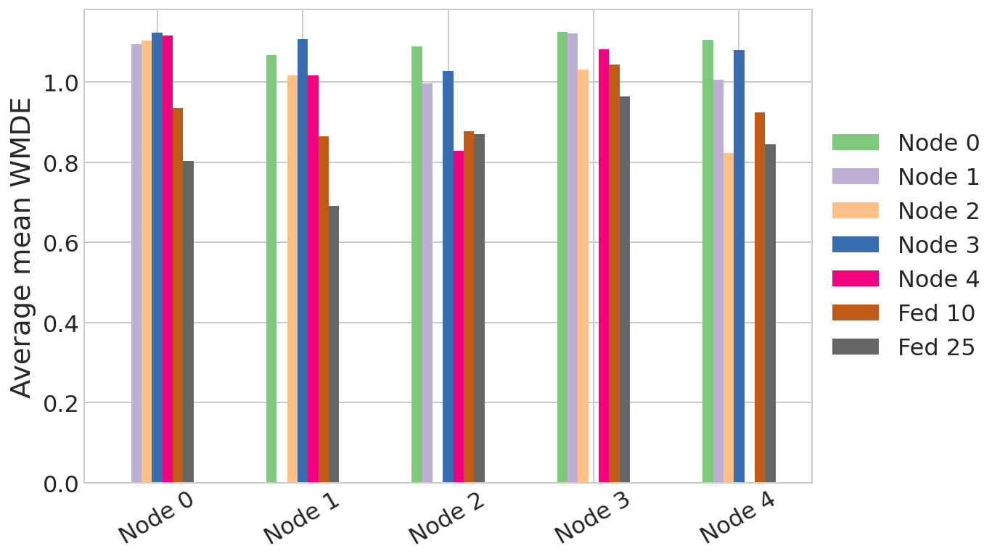

In [84]:
# creating the dataframe
df = pd.DataFrame(data = distances, 
                  index = index_values, 
                  columns = column_values)
print(df)

# Create plot
ax = df.plot.bar(rot=30,colormap='Accent')
ax.legend(loc='center left',bbox_to_anchor=(1.0, 0.5))
ax.set_ylabel("Average min WMDE")

## 200 words

In [85]:
n_words = 200
tfidf = True

distances = np.zeros((len(node_models), len(all_models)))

for idx_ref, ref_model in enumerate(node_models):
    this_topic_dst = []
    ref_topics = [el[1].split(', ') for el in TMmodel(ref_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
    for idx_comp, comp_model in enumerate(all_models):
        comp_topics = [el[1].split(', ') for el in TMmodel(comp_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
        all_dist = np.zeros((len(ref_topics), len(comp_topics)))
        for idx1,tpc1 in enumerate(ref_topics):
            for idx2,tpc2 in enumerate(comp_topics):
                all_dist[idx1,idx2] = model.wmdistance(tpc1[:n_words], tpc2[:n_words])
        distances[idx_ref, idx_comp] = np.mean(np.min(all_dist,axis=1))

# creating a list of index names
index_values = ['Node ' + str(el) for el in range(5)]

# creating a list of column names
column_values = index_values + ['Fed 10', 'Fed 25']

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 3 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(197 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(197 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T00:24:19.060337', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.key

INFO:gensim.models.keyedvectors:Removed 5 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T00:24:45.929343', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(383 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 383 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(383 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 383 corpus positions)", 'datetime': '2022-10-27T00:25:11.407846', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 14 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(381 unique tokens: ['abrupt', 'acc

INFO:gensim.models.keyedvectors:Removed 8 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 389 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T00:25:35.789589', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 9 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T00:26:01.462629', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T00:26:23.435071', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['ability', 'able', 'abstracti

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T00:26:48.994783', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 docume

INFO:gensim.models.keyedvectors:Removed 3 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T00:27:16.173594', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: []

INFO:gensim.models.keyedvectors:Removed 5 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T00:27:43.542243', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique toke

INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T00:28:09.031669', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: 

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T00:28:37.368028', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T00:29:06.440751', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.models.keyedvectors:Removed 14 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 386 corpus positions)", 'datetime': '2022-10-27T00:29:33.957557', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 14 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 8 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T00:30:01.370261', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 9 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T00:30:28.699469', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T00:30:51.822260', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 398 cor

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T00:31:16.119693', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T00:31:43.219797', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accessibility', 'activity'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T00:32:10.167056', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['3d', 'accuracy', 'ad

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T00:32:38.568663', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accident', 'accord', 'ac

INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T00:33:04.475234', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(382 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(382 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T00:33:31.668332', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.models.keyedvectors:Removed 14 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 385 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 385 corpus positions)", 'datetime': '2022-10-27T00:34:01.727964', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 14 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 8 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T00:34:28.488412', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(383 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(383 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T00:34:54.602852', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T00:35:19.749211', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(380 unique tokens: ['ability', 'able', 'abstracti

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T00:35:47.444076', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['acceleration', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(377 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(377 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T00:36:18.513506', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(341 unique tokens: ['accessibility', 'activity'

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T00:36:44.813067', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['3d', 'accuracy', 'ad

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T00:37:13.923835', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accident', 'accord', 'ac

INFO:gensim.models.keyedvectors:Removed 3 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T00:37:35.832067', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 5 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T00:38:02.161205', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.models.keyedvectors:Removed 14 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(377 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 382 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(377 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 382 corpus positions)", 'datetime': '2022-10-27T00:38:30.141075', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 14 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 8 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T00:38:57.771601', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 9 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 387 corpus positions)", 'datetime': '2022-10-27T00:39:24.739847', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T00:39:47.940850', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['ability', 'able', 'abstracti

INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T00:40:13.831124', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 398 corpus p

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T00:40:40.971209', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 395 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T00:41:06.384370', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (t

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T00:41:33.084691', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 3

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T00:41:57.454338', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 389 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(383 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 386 corpus positions)", 'datetime': '2022-10-27T00:42:27.481374', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 387 cor

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(370 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 377 corpus positions)", 'datetime': '2022-10-27T00:42:52.831803', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 14 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(375 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 378 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(375 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 do

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(378 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 383 corpus positions)", 'datetime': '2022-10-27T00:43:20.393622', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(376 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 384 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(376 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(380 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 382 corpus positions)", 'datetime': '2022-10-27T00:43:45.460603', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(379 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 383 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(379 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 383 cor

INFO:gensim.models.keyedvectors:Removed 0 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T00:44:11.088933', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T00:44:38.133359', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['acceleration', '

INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 389 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T00:45:03.559565', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 391 corpus positions)
INFO:

INFO:gensim.corpora.dictionary:built Dictionary(384 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(384 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 387 corpus positions)", 'datetime': '2022-10-27T00:45:29.439234', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 389 corpus positio

INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T00:45:54.257361', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 393 corpus positions)
IN

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T00:46:22.015150', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['abstraction'

INFO:gensim.models.keyedvectors:Removed 5 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 386 corpus positions)", 'datetime': '2022-10-27T00:46:51.308397', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.models.keyedvectors:Removed 14 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(358 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 377 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(358 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 377 corpus positions)", 'datetime': '2022-10-27T00:47:19.514901', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 14 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 8 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(362 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 383 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(362 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 383 corpus positions)", 'datetime': '2022-10-27T00:47:46.966192', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 9 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(382 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 382 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(382 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 382 corpus positions)", 'datetime': '2022-10-27T00:48:13.902594', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T00:48:38.162561', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(376 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 398 corpus positions)
INFO:gen

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T00:49:03.091242', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(374 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(374 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 docume

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T00:49:31.228143', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 395 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 386 corpus positions)", 'datetime': '2022-10-27T00:50:00.257129', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(303 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(303 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (t

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T00:50:26.728802', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 3

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T00:50:49.755832', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T00:51:14.111310', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T00:51:41.684516', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T00:52:10.673251', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 395 cor

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['access', 'achievable', 'ad', 'admission', 'adversary']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T00:52:38.433036', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.models.keyedvectors:Removed 14 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(382 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 383 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(382 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 383 corpus positions)", 'datetime': '2022-10-27T00:53:09.411251', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 14 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uni

INFO:gensim.models.keyedvectors:Removed 14 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(350 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 375 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(350 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 375 corpus positions)", 'datetime': '2022-10-27T00:53:35.965523', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 14 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uni

INFO:gensim.models.keyedvectors:Removed 14 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['abrupt', 'accumulative', 'allot', 'altered', 'amplification']...) from 2 documents (total 386 corpus positions)", 'datetime': '2022-10-27T00:54:03.794217', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniqu

INFO:gensim.models.keyedvectors:Removed 8 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T00:54:31.626227', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 8 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['accentuate', 'accumulative', 'adaption', 'affected', 'affordable']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T00:54:59.097160', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 9 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(384 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(384 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T00:55:25.932187', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])


INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(380 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 380 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(380 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 380 corpus positions)", 'datetime': '2022-10-27T00:55:49.686240', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(373 unique tokens: ['additive', 'admit', 'algebra

INFO:gensim.corpora.dictionary:built Dictionary(379 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(379 unique tokens: ['additive', 'admit', 'algebraic', 'ant', 'approximate']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T00:56:12.544817', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(398 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 398 corpus positions)
INFO:gen

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(398 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T00:56:42.696142', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 397 cor

INFO:gensim.models.keyedvectors:Removed 0 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T00:57:11.151187', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['ability', 'able', 'abstracti

INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T00:57:37.198783', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 389 corpus 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T00:58:05.580798', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['acceleration', 'accurate', 'acoustic', 'active', 'actuator']...) from 2 docum

INFO:gensim.models.keyedvectors:Removed 3 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T00:58:32.539613', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.models.keyedvectors:Removed 3 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T00:58:55.832154', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(367 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(367 unique tokens: ['accessibility', 'activity', 'actor', 'adult', 'agency']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T00:59:19.489989', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.models.keyedvectors:Removed 5 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(384 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 384 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(384 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 384 corpus positions)", 'datetime': '2022-10-27T00:59:46.686195', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 17 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tok

INFO:gensim.models.keyedvectors:Removed 5 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 385 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['3d', 'accuracy', 'adversarial', 'alignment', 'anatomical']...) from 2 documents (total 385 corpus positions)", 'datetime': '2022-10-27T01:00:14.492537', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique toke

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:00:43.592461', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:01:08.328156', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['accident', 'accord', 'accordance', 'activate', 'adjust']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T01:01:34.732164', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 400 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T01:02:01.120123', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(381 unique tokens: ['abuse', 'accountability', 'act', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(383 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 400 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(383 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T01:02:27.522083', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique 

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:02:54.060200', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:03:22.142889', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 11 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 389 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T01:03:47.122063', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:04:13.809779', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(373 unique tokens: ['adult', 'affordability', 'age', 'aged', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(375 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(375 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 387 corpus positions)", 'datetime': '2022-10-27T01:04:38.168178', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 13 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(379 unique tokens: ['accumulation', 'a

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T01:05:03.742006', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(381 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(381 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:05:29.313575', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 400 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T01:05:55.584407', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(371 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 397 corpus positions)

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 387 corpus positions)", 'datetime': '2022-10-27T01:06:20.624919', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(398 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(398 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 399 corpus posit

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T01:06:46.228744', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:07:10.592406', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:07:32.073330', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 11 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T01:07:55.307258', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:08:20.034219', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['adult', 'affordability', 'age', 'aged', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 386 corpus positions)", 'datetime': '2022-10-27T01:08:43.944843', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 13 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(383 unique tokens: ['accumulation', 'a

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:09:09.842266', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:09:34.348234', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T01:09:56.941501', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 398 corpus positions)

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T01:10:20.932993', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 399 corpus posit

INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T01:10:50.572313', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']..

INFO:gensim.models.keyedvectors:Removed 2 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T01:11:17.134230', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 4 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(376 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(376 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T01:11:40.047793', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 11 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(371 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 381 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(371 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 381 corpus positions)", 'datetime': '2022-10-27T01:12:04.191751', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T01:12:27.788472', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['adult', 'affordability', 'age', 'aged', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(378 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 379 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(378 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 379 corpus positions)", 'datetime': '2022-10-27T01:12:52.446880', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 13 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['accumulation', 'a

INFO:gensim.models.keyedvectors:Removed 1 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T01:13:16.228613', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T01:13:39.235679', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 0 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T01:14:08.185033', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:14:34.724117', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(380 unique tokens: ['abuse', 'accountability', 'act', '

INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:15:01.354921', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique 

INFO:gensim.models.keyedvectors:Removed 2 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T01:15:27.361344', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 4 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T01:15:52.316302', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 11 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(383 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 384 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(383 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 384 corpus positions)", 'datetime': '2022-10-27T01:16:17.974814', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T01:16:42.387826', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['adult', 'affordability', 'age', 'aged', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(380 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 382 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(380 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 382 corpus positions)", 'datetime': '2022-10-27T01:17:06.982677', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 13 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(382 unique tokens: ['accumulation', 'a

INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T01:17:30.198958', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T01:17:56.001025', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:18:22.053385', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(361 unique tokens: ['accord', 'achieve', 'a

INFO:gensim.corpora.dictionary:built Dictionary(333 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 400 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(333 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T01:18:49.839122', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(357 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(400 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 400 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(400 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T01:19:16.366623', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique 

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:19:44.869907', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:20:08.855793', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 11 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 389 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T01:20:34.418248', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:20:57.948151', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['adult', 'affordability', 'age', 'aged', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 387 corpus positions)", 'datetime': '2022-10-27T01:21:22.203846', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 13 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(362 unique tokens: ['accumulation', 'a

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T01:21:45.311697', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(398 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(398 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:22:13.007947', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 400 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T01:22:40.529386', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['accord', 'achieve', 'a

INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:23:03.431463', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(398 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:23:28.760714', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(398 unique 

INFO:gensim.models.keyedvectors:Removed 2 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T01:23:54.189985', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 4 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T01:24:19.745105', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 11 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 385 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 385 corpus positions)", 'datetime': '2022-10-27T01:24:44.626048', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(376 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(376 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T01:25:11.486981', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['adult', 'affordability', 'age', 'aged', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(383 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 383 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(383 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 383 corpus positions)", 'datetime': '2022-10-27T01:25:35.676446', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 13 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(352 unique tokens: ['accumulation', 'a

INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(336 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(336 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:25:59.416434', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 2 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T01:26:21.729239', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:26:46.355981', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(382 unique tokens: ['accord', 'achieve', 'a

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(382 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 383 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(382 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 383 corpus positions)", 'datetime': '2022-10-27T01:27:14.375786', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(380 unique tokens: ['abuse', 'accountability', 'act', '

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['abuse', 'accountability', 'act', 'action', 'actor']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:27:43.645733', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:ge

INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:28:09.965199', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']..

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:28:40.332676', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document 

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['abatement', 'adaptation', 'agglomeration', 'agricultural', 'agriculture']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T01:29:06.042782', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique 

INFO:gensim.models.keyedvectors:Removed 2 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T01:29:30.891654', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(377 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(377 unique tokens: ['additive', 'advertising', 'agent', 'aggregation', 'airline']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:29:57.496550', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 4 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T01:30:23.937345', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T01:30:48.186839', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dict

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['2nd', 'abandonment', 'accentuate', 'accompanying', 'accomplishment']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:31:13.390392', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 11 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 385 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 385 corpus positions)", 'datetime': '2022-10-27T01:31:37.902288', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 11 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(381 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(381 unique tokens: ['ac', 'accelerated', 'accompanying', 'activate', 'advisable']...) from 2 documents (total 386 corpus positions)", 'datetime': '2022-10-27T01:32:01.147634', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 4 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T01:32:27.759708', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.c

INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T01:32:49.673142', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 385 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(381 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:33:16.739066', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 396 corpus positions)", '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(382 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 383 corpus positions)", 'datetime': '2022-10-27T01:33:40.528357', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 13 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 document

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(378 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 384 corpus positions)", 'datetime': '2022-10-27T01:34:03.901209', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 13 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['accumulation', 'adjustment', 'african', 'aggregate', 'aid']...) from 2 document

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:34:27.755053', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(299 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:34:54.288485', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(377 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:35:18.468162', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(371 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(371 unique tokens: ['accounting', 'acquire', 'acquisition', 'activity', 'alliance']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T01:35:42.672070', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (tota

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:36:10.317087', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjusted']...) from 2 documents (tota

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:36:37.427958', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (tota

INFO:gensim.models.keyedvectors:Removed 0 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 389 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T01:37:09.097979', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accord', 'achieve', '

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(339 unique tokens: ['accord', 'achieve', 'activity', 'addition', 'additional']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T01:37:32.840807', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 5 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Diction

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T01:37:57.223173', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['absorb',

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:38:27.098749', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:38:55.978484', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:39:20.807122', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:39:47.792889', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:40:16.675526', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(383 unique tokens: ['2nd', 'accompanying', 'accountant

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(383 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(383 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T01:40:40.783690', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(383 unique tokens: ['accrue', 'adept', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T01:41:07.112356', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(371 unique tokens: ['abstraction', 'accou

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:41:36.429324', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:42:02.951343', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built 

INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:42:30.144530', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(398 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(398 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:42:55.259156', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(372 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(372 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T01:43:18.113664', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to

INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:43:42.886629', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(375 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(375 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T01:44:08.435290', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:44:33.558097', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['2nd', 'accompanying', 'accountant

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 389 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T01:44:57.269135', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accrue', 'adept', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T01:45:25.659726', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['abstraction', 'accou

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T01:45:50.793554', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(307 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(307 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T01:46:16.066086', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 5 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built 

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T01:46:42.213714', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:47:09.124043', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:47:32.314712', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(371 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(371 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:47:55.116496', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(382 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(382 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:48:18.558979', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(384 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(384 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:48:43.517708', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(384 unique tokens: ['2nd', 'accompanying', 'accountant

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T01:49:06.031212', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['accrue', 'adept', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T01:49:32.152728', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['abstraction', 'accou

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:49:56.315322', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(199 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(199 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:50:17.990885', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 5 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T01:50:41.756916', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:51:08.888883', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictiona

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:51:33.577230', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 t

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:51:57.104342', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:52:21.798101', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(345 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(345 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:52:48.064025', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(370 unique tokens: ['2nd', 'accompanying', 'accountan

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T01:53:11.641372', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(361 unique tokens: ['accrue', 'adept',

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T01:53:39.076639', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(365 unique tokens: ['abstraction', 'acco

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:54:04.614318', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictio

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(377 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(377 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:54:26.938843', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 5 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built 

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T01:54:50.220928', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:55:18.687786', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(368 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(368 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:55:42.990322', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:56:07.283808', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T01:56:31.284893', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(379 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(379 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:57:00.095252', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['2nd', 'accompanying', 'accountant

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T01:57:23.280360', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['accrue', 'adept', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T01:57:50.001690', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['abstraction', 'accou

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:58:17.490959', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(274 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(274 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:58:42.045805', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built 

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T01:59:09.632425', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T01:59:34.475582', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(378 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(378 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T01:59:58.085556', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:00:23.813155', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(381 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(381 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:00:50.244847', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T02:01:13.787869', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['2nd', 'accompanying', 'accountant

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T02:01:39.542075', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accrue', 'adept', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T02:02:09.067895', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(372 unique tokens: ['abstraction', 'accou

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:02:34.169630', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(269 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(269 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:02:56.944835', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built 

INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:03:23.261014', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['accusation', 'accuse', 'affirmative', 'aftermath', 'aggression']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T02:03:48.795477', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:04:17.014914', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictiona

INFO:gensim.models.keyedvectors:Removed 2 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 387 corpus positions)", 'datetime': '2022-10-27T02:04:45.655387', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictiona

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['absorb', 'abundant', 'accelerate', 'accomplishment', 'accordance']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:05:14.029396', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(398 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(398 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T02:05:39.531600', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['abortion', 'accountability', 'act', 'administration', 'administrative']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:06:08.623468', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to

INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T02:06:30.383346', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0

INFO:gensim.models.keyedvectors:Removed 4 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 385 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 385 corpus positions)", 'datetime': '2022-10-27T02:06:53.970465', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0

INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(378 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(378 unique tokens: ['accounting', 'acquire', 'acquisition', 'administrator', 'align']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T02:07:20.610161', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T02:07:43.427780', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['acculturation', 'adolescent', 'adult', 'affect', 'aged']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:08:10.827647', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:08:37.035440', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['activist', 'african', 'american',

INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 387 corpus positions)", 'datetime': '2022-10-27T02:09:05.134607', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(398 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['activist', 'african', 'american', 'anti', 'artist']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:09:31.941476', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T02:09:54.617501', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(381 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(381 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 document

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(376 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T02:10:18.208167', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(381 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 documents (total 381 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(381 unique tokens: ['2nd', 'accompanying', 'accountant', 'accrue', 'achievable']...) from 2 document

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T02:10:44.875640', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(380 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 382 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(380 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(378 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 381 corpus positions)", 'datetime': '2022-10-27T02:11:13.891892', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (t

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['accrue', 'adept', 'adventure', 'alternate', 'ambivalence']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T02:11:39.976296', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) f

INFO:gensim.corpora.dictionary:built Dictionary(398 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(398 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T02:12:08.011898', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 document

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(368 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(368 unique tokens: ['abstraction', 'accounting', 'actor', 'adaptation', 'advertisement']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:12:37.460641', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Diction

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T02:13:00.808586', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.

INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T02:13:29.486868', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(398 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictiona

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(345 unique tokens: ['ability', 'able', 'accord', 'achieve', 'action']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T02:13:52.612897', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 19 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(375 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 378 corpus positions)
INFO:gensim.utils:Dictionary lif

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(378 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 380 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(378 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 380 corpus positions)", 'datetime': '2022-10-27T02:14:16.585670', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(366 unique tokens: ['accept

INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T02:14:40.358071', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 393 cor

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:15:07.347755', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:addin

INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T02:15:35.695546', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:16:02.511068', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T02:16:27.124399', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T02:16:51.614741', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T02:17:17.734746', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T02:17:44.191607', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:18:14.481488', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 19 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(372 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 381 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(372 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(381 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 381 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(381 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 381 corpus positions)", 'datetime': '2022-10-27T02:18:39.099709', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(374 unique tokens: ['accept

INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T02:19:04.933027', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 396 cor

INFO:gensim.models.keyedvectors:Removed 4 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T02:19:28.919520', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:addin

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:19:53.640710', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(336 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(336 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T02:20:18.130948', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(370 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(370 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T02:20:44.314294', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 9 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T02:21:10.927129', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:21:38.728122', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(380 unique tokens: ['accord', 'act', 'add', '

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(380 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(380 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T02:22:06.230755', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 19 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(375 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 376 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(375 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 376 corpus positions)", 'datetime': '2022-10-27T02:22:31.545893', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 19 and 2 OOV words from document 1 and 2 (respe

INFO:gensim.models.keyedvectors:Removed 9 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(380 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(380 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 386 corpus positions)", 'datetime': '2022-10-27T02:22:56.490477', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T02:23:21.859406', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary

INFO:gensim.models.keyedvectors:Removed 2 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T02:23:46.339935', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T02:24:11.673511', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 3 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T02:24:32.712746', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 9 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(373 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(373 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 386 corpus positions)", 'datetime': '2022-10-27T02:25:00.658192', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 5 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T02:25:25.483885', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:25:53.036812', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.cor

INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T02:26:20.384352', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 397 corpu

INFO:gensim.models.keyedvectors:Removed 19 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(181 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 362 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(181 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 362 corpus positions)", 'datetime': '2022-10-27T02:26:42.840093', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 19 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictiona

INFO:gensim.models.keyedvectors:Removed 9 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(372 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 372 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(372 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 372 corpus positions)", 'datetime': '2022-10-27T02:27:07.039356', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
IN

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(375 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 377 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(375 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 377 corpus positions)", 'datetime': '2022-10-27T02:27:29.527131', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary

INFO:gensim.models.keyedvectors:Removed 2 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(379 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 379 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(379 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 379 corpus positions)", 'datetime': '2022-10-27T02:27:54.478954', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dict

INFO:gensim.models.keyedvectors:Removed 1 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(380 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 380 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(380 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 380 corpus positions)", 'datetime': '2022-10-27T02:28:20.137699', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique 

INFO:gensim.models.keyedvectors:Removed 3 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(363 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 378 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(363 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 378 corpus positions)", 'datetime': '2022-10-27T02:28:44.401291', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0

INFO:gensim.models.keyedvectors:Removed 9 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(372 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 372 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(372 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 372 corpus positions)", 'datetime': '2022-10-27T02:29:09.546032', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: 

INFO:gensim.models.keyedvectors:Removed 5 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(376 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 376 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(376 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 376 corpus positions)", 'datetime': '2022-10-27T02:29:31.244739', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: 

INFO:gensim.models.keyedvectors:Removed 0 and 19 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(381 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 381 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(381 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 381 corpus positions)", 'datetime': '2022-10-27T02:29:58.150839', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.co

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(380 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 380 corpus positions)", 'datetime': '2022-10-27T02:30:22.876025', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 doc

INFO:gensim.corpora.dictionary:built Dictionary(376 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 378 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(376 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 378 corpus positions)", 'datetime': '2022-10-27T02:30:46.355757', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 19 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(376 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (to

INFO:gensim.models.keyedvectors:Removed 9 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(375 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(375 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T02:31:10.995337', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T02:31:32.969170', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary

INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:31:58.695888', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T02:32:26.777032', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 3 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T02:32:50.927452', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 9 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(382 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(382 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T02:33:16.129305', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 5 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T02:33:38.743543', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T02:34:03.793346', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.cor

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T02:34:31.227324', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(383 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(383 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 doc

INFO:gensim.corpora.dictionary:built Dictionary(374 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 381 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(374 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 381 corpus positions)", 'datetime': '2022-10-27T02:34:56.660109', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 19 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(377 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (to

INFO:gensim.models.keyedvectors:Removed 9 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(375 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(375 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T02:35:22.923607', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T02:35:46.074945', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(398 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(398 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:36:12.744083', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(398 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(398 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T02:36:35.773796', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(350 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(350 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T02:36:58.395698', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 9 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T02:37:27.347078', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(371 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(371 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:37:51.719022', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(337 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 400 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(337 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T02:38:21.341448', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'ameri

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(354 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T02:38:46.737441', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 doc

INFO:gensim.corpora.dictionary:built Dictionary(374 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 379 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(374 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 379 corpus positions)", 'datetime': '2022-10-27T02:39:09.588703', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 19 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(377 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (to

INFO:gensim.models.keyedvectors:Removed 19 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(375 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 378 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(375 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 378 corpus positions)", 'datetime': '2022-10-27T02:39:33.997542', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 19 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 19 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(360 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 373 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(360 unique tokens: ['actuality', 'alienation', 'alterity', 'ambivalence', 'anarchism']...) from 2 documents (total 373 corpus positions)", 'datetime': '2022-10-27T02:39:58.711781', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 19 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 9 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(373 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 381 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(373 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 381 corpus positions)", 'datetime': '2022-10-27T02:40:23.627238', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['accept', 'accommodate', 'agent', 'analogy', 'answer']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T02:40:49.616452', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(381 unique tokens: ['accept', 'accommodate', 'agen

INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T02:41:13.402599', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgmen

INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T02:41:37.980119', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:addin

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:42:02.039805', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['accompaniment', 'accountability', 'accountable', 'acknowledgment', 'actualize']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['accompaniment', 'accountability', 'accou

INFO:gensim.models.keyedvectors:Removed 2 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:42:28.598733', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dict

INFO:gensim.models.keyedvectors:Removed 2 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 387 corpus positions)", 'datetime': '2022-10-27T02:42:55.466564', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dict

INFO:gensim.models.keyedvectors:Removed 2 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['accessibility', 'accounting', 'accuracy', 'adjectival', 'adjective']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:43:22.698587', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(398 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(398 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T02:43:47.866260', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(379 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(379 unique tokens: ['activity', 'addition', 'analyze', 'assessment', 'available']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:44:15.260144', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 3 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T02:44:37.352974', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0

INFO:gensim.models.keyedvectors:Removed 3 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 386 corpus positions)", 'datetime': '2022-10-27T02:45:01.548274', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0

INFO:gensim.models.keyedvectors:Removed 3 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(376 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(376 unique tokens: ['absolute', 'activity', 'analytic', 'anthropology', 'articulate']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T02:45:28.066727', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 

INFO:gensim.models.keyedvectors:Removed 9 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T02:45:53.397149', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['accusation', 'acquaint', 'addressee', 'adversary', 'al']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T02:46:17.266832', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 5 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T02:46:43.500419', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: 

INFO:gensim.models.keyedvectors:Removed 5 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(384 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 384 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(384 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 384 corpus positions)", 'datetime': '2022-10-27T02:47:10.199124', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: 

INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['absorb', 'absurd', 'abundant', 'aesthetic', 'affection']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:47:39.326742', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T02:48:09.711326', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 397 corpus positions)", 'dat

INFO:gensim.models.keyedvectors:Removed 0 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'american']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T02:48:39.164697', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(314 unique tokens: ['accord', 'act', 'add', 'aesthetic', 'ameri

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T02:49:02.759677', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 do

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(399 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T02:49:30.690745', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 documents (total 389 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['african', 'american', 'anglican', 'apocalyptic', 'attention']...) from 2 do

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T02:49:54.805172', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['aboriginal', 'accident', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T02:50:21.092719', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['activism', '

INFO:gensim.models.keyedvectors:Removed 9 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T02:50:48.462934', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dic

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T02:51:10.690195', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 doc

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T02:51:37.733482', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 389 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 doc

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T02:52:01.464088', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['ability', 'accountability', 'accounting', 'accre

INFO:gensim.models.keyedvectors:Removed 5 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T02:52:27.516600', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T02:52:52.847541', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T02:53:19.648923', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(382 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(382 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 390 corpus

INFO:gensim.models.keyedvectors:Removed 1 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T02:53:48.274893', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T02:54:15.411416', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['aboriginal', 'accident', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(399 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(399 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T02:54:42.807173', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['activism', '

INFO:gensim.models.keyedvectors:Removed 9 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T02:55:07.700481', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dic

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T02:55:33.464746', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(383 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(383 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 doc

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T02:56:00.529796', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 doc

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T02:56:25.918036', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['ability', 'accountability', 'accounting', 'accre

INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(355 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(355 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:56:50.849041', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(400 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 400 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(400 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 400 corpus positions)", 'datetime': '2022-10-27T02:57:15.871235', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['abortion', 'abuse', 'accept', 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T02:57:41.653082', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 393 corpus

INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T02:58:14.371807', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T02:58:37.713591', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['aboriginal', 'accident', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(373 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(373 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T02:59:06.045951', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['activism', '

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T02:59:27.090344', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) fr

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T02:59:51.868781', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 doc

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T03:00:18.515499', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(384 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(384 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 doc

INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T03:00:45.254209', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(284 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrat

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T03:01:07.071927', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(303 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(303 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T03:01:34.876078', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(354 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(354 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T03:02:02.357899', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accession', 'affair', 'allianc

INFO:gensim.corpora.dictionary:built Dictionary(368 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(368 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T03:02:31.060751', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dicti

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T03:02:50.978971', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 395 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T03:03:17.697663', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(378 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 387 corpus positions)", 'datetime': '2022-10-27T03:03:39.767672', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 389 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 389 corpus positions)", 'datetime': '202

INFO:gensim.models.keyedvectors:Removed 8 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(381 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(381 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T03:04:05.492019', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 392 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T03:04:32.370842', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(392 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T03:04:55.886018', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding docume

INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T03:05:22.050795', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T03:05:48.043606', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T03:06:14.544881', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 394 corpus positions)
INFO:gensim

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(397 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T03:06:40.946299', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(349 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(349 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 398 corpus positions)"

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T03:07:01.842315', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 391 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T03:07:28.611191', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(348 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 383 corpus positions)", 'datetime': '2022-10-27T03:07:52.297837', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(382 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 385 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(382 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 385 corpus positions)", 'datetime': '202

INFO:gensim.models.keyedvectors:Removed 8 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(384 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(384 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 386 corpus positions)", 'datetime': '2022-10-27T03:08:16.664198', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 6 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(194 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(194 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T03:08:44.064032', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 4 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T03:09:07.711593', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding docume

INFO:gensim.models.keyedvectors:Removed 5 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 389 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T03:09:33.299614', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(394 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(394 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T03:09:58.523050', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 389 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 389 corpus positions)", 'datetime': '2022-10-27T03:10:25.524139', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 391 corpus positions)
INFO:gensim

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T03:10:49.836138', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(384 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(384 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 395 corpus positions)"

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T03:11:15.771904', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 396 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T03:11:43.646057', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(359 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 398 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(359 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 

INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 390 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 390 corpus positions)", 'datetime': '2022-10-27T03:12:07.257282', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dic

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(391 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(391 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T03:12:33.400079', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['abstraction', 

INFO:gensim.models.keyedvectors:Removed 6 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 393 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 393 corpus positions)", 'datetime': '2022-10-27T03:13:01.646953', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T03:13:29.410028', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding docume

INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T03:13:55.634603', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(303 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(303 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T03:14:23.595618', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(397 unique tokens: ['abortion', 'abuse', 'accept', 

INFO:gensim.corpora.dictionary:built Dictionary(357 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(357 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 394 corpus positions)", 'datetime': '2022-10-27T03:14:50.511587', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(383 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 393 corpus positions)
INFO:gensim

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 398 corpus positions)", 'datetime': '2022-10-27T03:15:19.589998', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 397 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 397 corpus positions)"

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(380 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 387 corpus positions)", 'datetime': '2022-10-27T03:15:41.211768', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 386

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T03:16:04.558873', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['aboriginal', 'accident', 'admit', 'advise', 'advisory']...) from 2 documents (total 387

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(380 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 397 corpus positions)", 'datetime': '2022-10-27T03:16:33.176536', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(389 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(389 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T03:16:57.526620', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(370 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T03:17:24.727446', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(371 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(371 unique tokens: ['activism', 'activist', 'advertisement', 'advertising', 'anti']...) from 2 

INFO:gensim.models.keyedvectors:Removed 9 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(371 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 380 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(371 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 380 corpus positions)", 'datetime': '2022-10-27T03:17:51.402526', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 17 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.d

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(365 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 381 corpus positions)", 'datetime': '2022-10-27T03:18:15.571667', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(366 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 382 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(366 unique tokens: ['2nd', 'accrue', 'ad', 'adept', 'adversity']...) from 2 documents (total 382 corpus positions)", 'datetime': '202

INFO:gensim.models.keyedvectors:Removed 8 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T03:18:41.623214', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 8 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(387 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 387 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(387 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 387 corpus positions)", 'datetime': '2022-10-27T03:19:09.913559', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 8 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['abstraction', 'accompanying', 'adviser', 'alarming', 'allot']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T03:19:35.196555', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 6 and 17 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(373 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 377 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(373 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 377 corpus positions)", 'datetime': '2022-10-27T03:20:02.763099', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniqu

INFO:gensim.models.keyedvectors:Removed 6 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(385 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 385 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(385 unique tokens: ['absorb', 'abundant', 'academy', 'accelerate', 'acceleration']...) from 2 documents (total 385 corpus positions)", 'datetime': '2022-10-27T03:20:27.917639', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T03:20:52.798201', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding docume

INFO:gensim.models.keyedvectors:Removed 4 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(272 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(272 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T03:21:15.979746', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding docume

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(384 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(384 unique tokens: ['ability', 'accountability', 'accounting', 'accreditation', 'administrator']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T03:21:40.893810', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding docume

INFO:gensim.models.keyedvectors:Removed 5 and 17 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(373 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 378 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(373 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 378 corpus positions)", 'datetime': '2022-10-27T03:22:07.211590', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary

INFO:gensim.models.keyedvectors:Removed 5 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(386 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 386 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(386 unique tokens: ['adaptation', 'adolescent', 'adverse', 'advocacy', 'agricultural']...) from 2 documents (total 386 corpus positions)", 'datetime': '2022-10-27T03:22:32.601652', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(396 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(396 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T03:23:00.323010', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INF

INFO:gensim.corpora.dictionary:built Dictionary(395 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 395 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(395 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 395 corpus positions)", 'datetime': '2022-10-27T03:23:28.841328', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(392 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 398 corpus positions)
INFO:gensim

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(363 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(363 unique tokens: ['abortion', 'abuse', 'accept', 'accord', 'accordance']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T03:23:58.750356', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['abortion', 'abuse', 'accept', 

INFO:gensim.corpora.dictionary:built Dictionary(371 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 391 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(371 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 391 corpus positions)", 'datetime': '2022-10-27T03:24:25.091016', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 395 corpus positions)
INFO:gensim

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 392 corpus positions)", 'datetime': '2022-10-27T03:24:51.988358', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 5 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(393 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 394 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(393 unique tokens: ['accession', 'affair', 'alliance', 'ambition', 'arab']...) from 2 documents (total 394 corpus

INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(390 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 396 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(390 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 396 corpus positions)", 'datetime': '2022-10-27T03:25:22.427677', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 10 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensi

INFO:gensim.corpora.dictionary:built Dictionary(388 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 388 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(388 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 388 corpus positions)", 'datetime': '2022-10-27T03:25:51.333938', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(399 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 399 corpus positions)
INFO:gensim.utils:Dicti

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(344 unique tokens: ['able', 'accord', 'achieve', 'action', 'activity']...) from 2 documents (total 399 corpus positions)", 'datetime': '2022-10-27T03:26:14.973244', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}


          Node 0    Node 1    Node 2    Node 3    Node 4    Fed 10    Fed 25
Node 0  0.000000  1.014605  1.051253  1.063333  1.069004  0.874942  0.707054
Node 1  0.994146  0.000000  0.944999  1.045831  0.947482  0.783506  0.621073
Node 2  1.037059  0.921370  0.000000  0.973444  0.776984  0.812672  0.780132
Node 3  1.054082  1.049182  0.963957  0.000000  1.010196  0.973645  0.878391
Node 4  1.052530  0.939187  0.770568  1.015427  0.000000  0.861120  0.770386


Text(0, 0.5, 'Average mean WMDE')

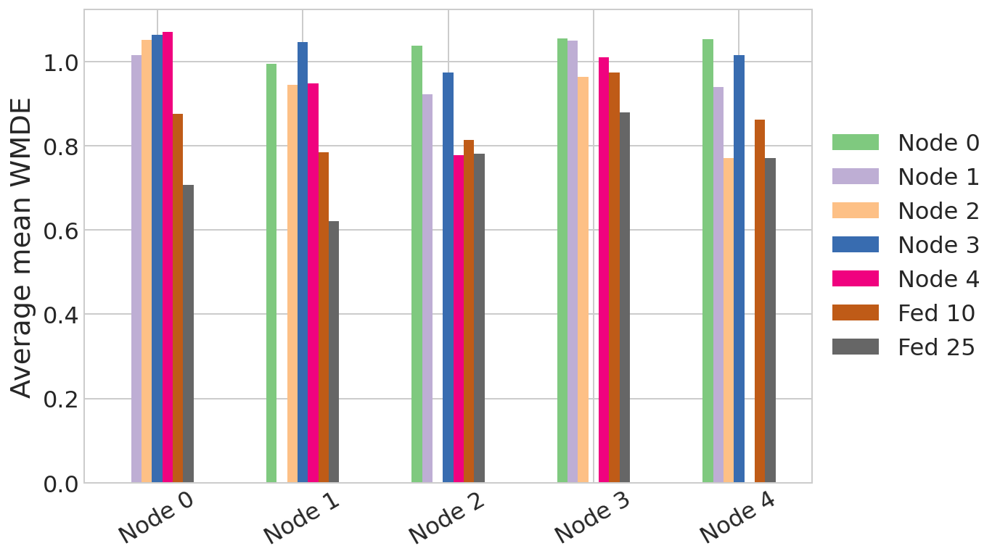

In [86]:
# creating the dataframe
df = pd.DataFrame(data = distances, 
                  index = index_values, 
                  columns = column_values)
print(df)

# Create plot
ax = df.plot.bar(rot=30,colormap='Accent')
ax.legend(loc='center left',bbox_to_anchor=(1.0, 0.5))
ax.set_ylabel("Average min WMDE")

## 300 words

In [ ]:
n_words = 300
tfidf = True

distances = np.zeros((len(node_models), len(all_models)))

for idx_ref, ref_model in enumerate(node_models):
    this_topic_dst = []
    ref_topics = [el[1].split(', ') for el in TMmodel(ref_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
    for idx_comp, comp_model in enumerate(all_models):
        comp_topics = [el[1].split(', ') for el in TMmodel(comp_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
        all_dist = np.zeros((len(ref_topics), len(comp_topics)))
        for idx1,tpc1 in enumerate(ref_topics):
            for idx2,tpc2 in enumerate(comp_topics):
                all_dist[idx1,idx2] = model.wmdistance(tpc1[:n_words], tpc2[:n_words])
        distances[idx_ref, idx_comp] = np.mean(np.min(all_dist,axis=1))

# creating a list of index names
index_values = ['Node ' + str(el) for el in range(5)]

# creating a list of column names
column_values = index_values + ['Fed 10', 'Fed 25']

INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:TMmodel:-- -- -- Topic model object (TMmodel) successfully created
INFO:gensim.models.keyedvectors:Removed 8 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(292 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 584 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(292 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 584 corpus positions)", 'datetime': '2022-10-27T03:26:17.689065', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.key

INFO:gensim.models.keyedvectors:Removed 9 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(583 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 583 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(583 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 583 corpus positions)", 'datetime': '2022-10-27T03:27:36.895645', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(571 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 572 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(571 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 572 corpus positions)", 'datetime': '2022-10-27T03:28:44.787667', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 20 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(571 unique tokens: ['abrupt', 'acc

INFO:gensim.models.keyedvectors:Removed 12 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(580 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 580 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(580 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 580 corpus positions)", 'datetime': '2022-10-27T03:29:53.827431', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 12 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 11 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(580 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 581 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(580 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 581 corpus positions)", 'datetime': '2022-10-27T03:30:58.053260', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 0 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(582 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 592 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(582 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 592 corpus positions)", 'datetime': '2022-10-27T03:32:06.942718', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(592 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 592 corpus positions)", 'datetime': '2022-10-27T03:33:16.971956', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(588 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 591 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(588 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 docume

INFO:gensim.models.keyedvectors:Removed 4 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(585 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 587 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(585 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 587 corpus positions)", 'datetime': '2022-10-27T03:34:36.802828', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 20 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dict

INFO:gensim.models.keyedvectors:Removed 9 and 9 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(579 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 582 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(579 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 582 corpus positions)", 'datetime': '2022-10-27T03:35:57.086446', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 20 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(584 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 590 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(584 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 590 corpus positions)", 'datetime': '2022-10-27T03:37:04.779857', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 20 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(579 unique tokens: ['accident', 'acc

INFO:gensim.models.keyedvectors:Removed 8 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(588 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 591 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(588 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 591 corpus positions)", 'datetime': '2022-10-27T03:38:12.377370', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(574 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 590 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(574 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 590 corpus positions)", 'datetime': '2022-10-27T03:39:30.863212', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.models.keyedvectors:Removed 20 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(577 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 579 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(577 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 579 corpus positions)", 'datetime': '2022-10-27T03:40:42.443550', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 20 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 12 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(580 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 587 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(580 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 587 corpus positions)", 'datetime': '2022-10-27T03:41:57.587385', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 12 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 11 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(584 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 588 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(584 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 588 corpus positions)", 'datetime': '2022-10-27T03:43:07.378478', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(569 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 599 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(569 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 599 corpus positions)", 'datetime': '2022-10-27T03:44:10.696201', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(568 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 599 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(568 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 599 corpus positions)", 'datetime': '2022-10-27T03:45:23.135358', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(584 unique tokens: ['absolute', 'acce

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(577 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 595 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(577 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 595 corpus positions)", 'datetime': '2022-10-27T03:46:45.928701', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(578 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 590 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(578 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 590 corpus positions)", 'datetime': '2022-10-27T03:47:55.540112', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(576 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 598 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(576 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 598 corpus positions)", 'datetime': '2022-10-27T03:49:09.234354', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(586 unique tokens: ['accident', 'acco

INFO:gensim.models.keyedvectors:Removed 8 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(576 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 586 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(576 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 586 corpus positions)", 'datetime': '2022-10-27T03:50:07.993233', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 9 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(579 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 585 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(579 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 585 corpus positions)", 'datetime': '2022-10-27T03:51:17.012017', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.models.keyedvectors:Removed 20 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(570 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 574 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(570 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 574 corpus positions)", 'datetime': '2022-10-27T03:52:35.998998', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 20 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 12 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(569 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 582 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(569 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 582 corpus positions)", 'datetime': '2022-10-27T03:53:56.621350', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 12 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(

INFO:gensim.models.keyedvectors:Removed 11 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(573 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 583 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(573 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 583 corpus positions)", 'datetime': '2022-10-27T03:55:09.252433', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(592 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 594 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(592 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 594 corpus positions)", 'datetime': '2022-10-27T03:56:28.643350', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
I

INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(586 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 594 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(586 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 594 corpus positions)", 'datetime': '2022-10-27T03:57:44.791306', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 4 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(585 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 590 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(585 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 590 corpus positions)", 'datetime': '2022-10-27T03:59:07.384801', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dicti

INFO:gensim.models.keyedvectors:Removed 9 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(576 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 585 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(576 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 585 corpus positions)", 'datetime': '2022-10-27T04:00:14.373139', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(582 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 593 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(582 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 593 corpus positions)", 'datetime': '2022-10-27T04:01:33.619035', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(584 unique tokens: ['accident', 'acco

INFO:gensim.models.keyedvectors:Removed 8 and 18 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(537 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 574 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(537 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 574 corpus positions)", 'datetime': '2022-10-27T04:02:40.134517', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uni

INFO:gensim.models.keyedvectors:Removed 9 and 18 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(568 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 573 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(568 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 573 corpus positions)", 'datetime': '2022-10-27T04:03:53.458219', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])


INFO:gensim.models.keyedvectors:Removed 20 and 18 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(561 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 562 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(561 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 562 corpus positions)", 'datetime': '2022-10-27T04:05:13.041391', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 20 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uni

INFO:gensim.models.keyedvectors:Removed 12 and 18 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(569 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 570 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(569 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 570 corpus positions)", 'datetime': '2022-10-27T04:06:39.637733', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 12 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary

INFO:gensim.models.keyedvectors:Removed 11 and 18 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(543 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 571 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(543 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 571 corpus positions)", 'datetime': '2022-10-27T04:07:51.272573', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniqu

INFO:gensim.models.keyedvectors:Removed 0 and 18 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(554 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 582 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(554 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 582 corpus positions)", 'datetime': '2022-10-27T04:09:10.080747', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])


INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(574 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 582 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(574 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 582 corpus positions)", 'datetime': '2022-10-27T04:10:20.338748', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(591 unique tokens: ['absolute', 'acce

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(570 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 578 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(570 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 578 corpus positions)", 'datetime': '2022-10-27T04:11:35.581686', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(589 unique tokens: ['

INFO:gensim.models.keyedvectors:Removed 9 and 18 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(564 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 573 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(564 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 573 corpus positions)", 'datetime': '2022-10-27T04:12:38.741461', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(576 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 581 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(576 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 581 corpus positions)", 'datetime': '2022-10-27T04:14:02.658757', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(588 unique tokens: ['accident', 'acco

INFO:gensim.models.keyedvectors:Removed 8 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(581 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 591 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(581 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 591 corpus positions)", 'datetime': '2022-10-27T04:15:06.423634', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 15 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uni

INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(578 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 590 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(578 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 590 corpus positions)", 'datetime': '2022-10-27T04:16:30.648818', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 15 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])


INFO:gensim.models.keyedvectors:Removed 20 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(577 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 579 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(577 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 579 corpus positions)", 'datetime': '2022-10-27T04:17:49.532102', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 20 and 15 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uni

INFO:gensim.models.keyedvectors:Removed 12 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(585 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 587 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(585 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 587 corpus positions)", 'datetime': '2022-10-27T04:19:10.120018', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 12 and 15 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary

INFO:gensim.models.keyedvectors:Removed 11 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(578 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 588 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(578 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 588 corpus positions)", 'datetime': '2022-10-27T04:20:19.480015', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 15 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniqu

INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(583 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 599 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(583 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 599 corpus positions)", 'datetime': '2022-10-27T04:21:34.592338', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 15 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])


INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(587 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 599 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(587 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 599 corpus positions)", 'datetime': '2022-10-27T04:22:47.890303', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 15 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique 

INFO:gensim.models.keyedvectors:Removed 4 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(563 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 595 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(563 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 595 corpus positions)", 'datetime': '2022-10-27T04:24:07.563785', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 15 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dict

INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(573 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 590 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(573 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 590 corpus positions)", 'datetime': '2022-10-27T04:25:16.531570', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 15 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(584 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 598 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(584 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 598 corpus positions)", 'datetime': '2022-10-27T04:26:30.454992', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 15 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(580 unique tokens: ['accident', 'acc

INFO:gensim.models.keyedvectors:Removed 8 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(588 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 590 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(588 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 590 corpus positions)", 'datetime': '2022-10-27T04:27:30.493381', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uni

INFO:gensim.models.keyedvectors:Removed 9 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(486 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 589 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(486 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 589 corpus positions)", 'datetime': '2022-10-27T04:28:41.852280', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])


INFO:gensim.models.keyedvectors:Removed 20 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(578 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 578 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(578 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 578 corpus positions)", 'datetime': '2022-10-27T04:29:57.841114', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 20 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uni

INFO:gensim.models.keyedvectors:Removed 12 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(586 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 586 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(586 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 586 corpus positions)", 'datetime': '2022-10-27T04:31:19.348010', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 12 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary

INFO:gensim.models.keyedvectors:Removed 11 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(578 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 587 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(578 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 587 corpus positions)", 'datetime': '2022-10-27T04:32:32.395881', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniqu

INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(580 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 598 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(580 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 598 corpus positions)", 'datetime': '2022-10-27T04:33:46.239765', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])


INFO:gensim.models.keyedvectors:Removed 0 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(541 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 598 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(541 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 598 corpus positions)", 'datetime': '2022-10-27T04:35:03.091497', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique 

INFO:gensim.models.keyedvectors:Removed 4 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(594 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 594 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(594 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 594 corpus positions)", 'datetime': '2022-10-27T04:36:26.321218', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dict

INFO:gensim.models.keyedvectors:Removed 9 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(589 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 589 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(589 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 589 corpus positions)", 'datetime': '2022-10-27T04:37:37.445820', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensi

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(489 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 597 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(489 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 597 corpus positions)", 'datetime': '2022-10-27T04:38:55.721576', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(585 unique tokens: ['accident', 'acc

INFO:gensim.models.keyedvectors:Removed 8 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(584 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 585 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(584 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 585 corpus positions)", 'datetime': '2022-10-27T04:39:56.781585', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 8 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(539 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 587 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(539 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 587 corpus positions)", 'datetime': '2022-10-27T04:41:07.215982', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 8 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(587 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 592 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(587 unique tokens: ['abstraction', 'adjective', 'algebra', 'alphabet', 'ambiguity']...) from 2 documents (total 592 corpus positions)", 'datetime': '2022-10-27T04:42:23.144407', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 8 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 9 and 18 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(572 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 573 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(572 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 573 corpus positions)", 'datetime': '2022-10-27T04:43:43.231444', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 21 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(577 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 577 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(577 unique tokens: ['accelerator', 'access', 'achievable', 'achieve', 'ad']...) from 2 documents (total 577 corpus positions)", 'datetime': '2022-10-27T04:44:58.225286', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 13 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(578 unique tokens: ['accelerator', 'access', 'ac

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(573 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 573 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(573 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 573 corpus positions)", 'datetime': '2022-10-27T04:46:16.990581', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 20 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(563 unique tokens: ['abrupt', 'acc

INFO:gensim.models.keyedvectors:Removed 20 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(575 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 575 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(575 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 575 corpus positions)", 'datetime': '2022-10-27T04:47:34.591774', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 20 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 20 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(580 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 580 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(580 unique tokens: ['abrupt', 'accentuate', 'accumulative', 'adaptivity', 'adder']...) from 2 documents (total 580 corpus positions)", 'datetime': '2022-10-27T04:48:59.725234', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 20 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 12 and 18 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(553 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 570 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(553 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 570 corpus positions)", 'datetime': '2022-10-27T04:50:21.749490', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 12 and 21 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 12 and 14 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(530 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 574 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(530 unique tokens: ['accentuate', 'accidental', 'accrue', 'accumulative', 'adaption']...) from 2 documents (total 574 corpus positions)", 'datetime': '2022-10-27T04:51:40.792004', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 12 and 13 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionar

INFO:gensim.models.keyedvectors:Removed 11 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(576 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 582 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(576 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 582 corpus positions)", 'datetime': '2022-10-27T04:52:57.344878', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 11 and 5 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(579 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 584 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(579 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 584 corpus positions)", 'datetime': '2022-10-27T04:54:16.030380', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 11 and 0 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(581 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 589 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(581 unique tokens: ['additive', 'admit', 'aggregation', 'algebraic', 'algorithm']...) from 2 documents (total 589 corpus positions)", 'datetime': '2022-10-27T04:55:31.843735', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 11 and 2 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique

INFO:gensim.models.keyedvectors:Removed 0 and 18 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(582 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 582 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(582 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 582 corpus positions)", 'datetime': '2022-10-27T04:56:43.158229', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 21 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])

INFO:gensim.corpora.dictionary:built Dictionary(586 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 586 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(586 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 586 corpus positions)", 'datetime': '2022-10-27T04:57:55.638965', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 13 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(587 unique tokens: ['ability', 'able', 'abstraction', 'action', 'activity']...) from 2 documents (total 587 corpus positions)
INFO:ge

INFO:gensim.models.keyedvectors:Removed 0 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(578 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 593 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(578 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 593 corpus positions)", 'datetime': '2022-10-27T04:59:03.937208', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 0 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(590 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 594 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(590 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 594 corpus positions)", 'datetime': '2022-10-27T05:00:12.643537', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(572 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 598 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(572 unique tokens: ['absolute', 'acceleration', 'accurate', 'acoustic', 'active']...) from 2 documents (total 598 corpus positions)", 'datetime': '2022-10-27T05:01:24.022100', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(585 unique tokens: ['absolute', 'acce

INFO:gensim.models.keyedvectors:Removed 4 and 21 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(572 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 575 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(572 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 575 corpus positions)", 'datetime': '2022-10-27T05:02:34.632503', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dict

INFO:gensim.models.keyedvectors:Removed 4 and 13 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(583 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 583 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(583 unique tokens: ['accessibility', 'activity', 'actor', 'administer', 'administration']...) from 2 documents (total 583 corpus positions)", 'datetime': '2022-10-27T05:03:46.346919', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 4 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dict

INFO:gensim.models.keyedvectors:Removed 9 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(578 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 584 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(578 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 584 corpus positions)", 'datetime': '2022-10-27T05:04:53.892711', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 7 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.corpora.dictionary:built Dictionary(577 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 585 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(577 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 585 corpus positions)", 'datetime': '2022-10-27T05:06:17.819819', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(584 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 588 corpus positions)
INFO:gensim.utils:Dicti

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(582 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 589 corpus positions)", 'datetime': '2022-10-27T05:07:36.143952', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 1 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(586 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 590 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(586 unique tokens: ['2d', '3d', 'abnormal', 'abnormality', 'accuracy']...) from 2 documents (total 590 corpus positions)"

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(569 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 578 corpus positions)", 'datetime': '2022-10-27T05:08:52.452546', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 8 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(581 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 591 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(581 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 docume

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(586 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 586 corpus positions)", 'datetime': '2022-10-27T05:09:58.206388', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 4 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(568 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 documents (total 595 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(568 unique tokens: ['accident', 'accord', 'accordance', 'acquire', 'acquisition']...) from 2 docume

INFO:gensim.corpora.dictionary:built Dictionary(580 unique tokens: ['abuse', 'accountability', 'act', 'action', 'activist']...) from 2 documents (total 580 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(580 unique tokens: ['abuse', 'accountability', 'act', 'action', 'activist']...) from 2 documents (total 580 corpus positions)", 'datetime': '2022-10-27T05:11:09.325506', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 12 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(581 unique tokens: ['abuse', 'accountability', 'act', 'action', 'activist']...) from 2 documents (total 588 corpus positions)
INFO:ge

INFO:gensim.models.keyedvectors:Removed 1 and 12 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(580 unique tokens: ['abatement', 'achieve', 'acre', 'acreage', 'adaptation']...) from 2 documents (total 587 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(580 unique tokens: ['abatement', 'achieve', 'acre', 'acreage', 'adaptation']...) from 2 documents (total 587 corpus positions)", 'datetime': '2022-10-27T05:12:29.116871', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.models.keyedvectors:Removed 3 and 12 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(583 unique tokens: ['adaptive', 'additive', 'advertising', 'agent', 'aggregation']...) from 2 documents (total 585 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(583 unique tokens: ['adaptive', 'additive', 'advertising', 'agent', 'aggregation']...) from 2 documents (total 585 corpus positions)", 'datetime': '2022-10-27T05:13:39.619276', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniq

INFO:gensim.models.keyedvectors:Removed 9 and 12 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(542 unique tokens: ['2nd', 'abandonment', 'ac', 'accentuate', 'accompanying']...) from 2 documents (total 579 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(542 unique tokens: ['2nd', 'abandonment', 'ac', 'accentuate', 'accompanying']...) from 2 documents (total 579 corpus positions)", 'datetime': '2022-10-27T05:14:53.357527', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens:

INFO:gensim.models.keyedvectors:Removed 17 and 12 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(545 unique tokens: ['abate', 'ac', 'accelerated', 'accentuate', 'accompanying']...) from 2 documents (total 571 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(545 unique tokens: ['abate', 'ac', 'accelerated', 'accentuate', 'accompanying']...) from 2 documents (total 571 corpus positions)", 'datetime': '2022-10-27T05:16:02.242372', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 17 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique t

INFO:gensim.models.keyedvectors:Removed 6 and 12 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(576 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 582 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(576 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 582 corpus positions)", 'datetime': '2022-10-27T05:17:13.291792', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim

INFO:gensim.models.keyedvectors:Removed 19 and 12 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(565 unique tokens: ['accelerate', 'acceleration', 'accession', 'accumulation', 'adjustment']...) from 2 documents (total 569 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(565 unique tokens: ['accelerate', 'acceleration', 'accession', 'accumulation', 'adjustment']...) from 2 documents (total 569 corpus positions)", 'datetime': '2022-10-27T05:18:30.991271', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 19 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #

INFO:gensim.models.keyedvectors:Removed 1 and 12 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(587 unique tokens: ['accountability', 'accountant', 'accounting', 'acquire', 'acquisition']...) from 2 documents (total 587 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(587 unique tokens: ['accountability', 'accountant', 'accounting', 'acquire', 'acquisition']...) from 2 documents (total 587 corpus positions)", 'datetime': '2022-10-27T05:19:38.707204', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to

INFO:gensim.models.keyedvectors:Removed 7 and 12 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(575 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjust']...) from 2 documents (total 581 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(575 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjust']...) from 2 documents (total 581 corpus positions)", 'datetime': '2022-10-27T05:20:50.960981', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 7 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(587 unique tokens: ['able', 'accord', 'achieve', 'activity', 'add']...) from 2 documents (total 587 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(587 unique tokens: ['able', 'accord', 'achieve', 'activity', 'add']...) from 2 documents (total 587 corpus positions)", 'datetime': '2022-10-27T05:22:01.078600', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 11 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(559 unique tokens: ['able', 'accord', 'achieve', 'activity', 'ad

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(591 unique tokens: ['abuse', 'accountability', 'act', 'action', 'activist']...) from 2 documents (total 591 corpus positions)", 'datetime': '2022-10-27T05:23:03.264716', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 17 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(583 unique tokens: ['abuse', 'accountability', 'act', 'action', 'activist']...) from 2 documents (total 583 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(583 unique tokens: ['abuse', 'accountability', 'act', 'action', 'activist']...) from 2 documents (total 583 co

INFO:gensim.models.keyedvectors:Removed 1 and 17 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(582 unique tokens: ['abatement', 'achieve', 'acre', 'acreage', 'adaptation']...) from 2 documents (total 582 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(582 unique tokens: ['abatement', 'achieve', 'acre', 'acreage', 'adaptation']...) from 2 documents (total 582 corpus positions)", 'datetime': '2022-10-27T05:24:24.644042', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: []

INFO:gensim.models.keyedvectors:Removed 3 and 17 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(580 unique tokens: ['adaptive', 'additive', 'advertising', 'agent', 'aggregation']...) from 2 documents (total 580 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(580 unique tokens: ['adaptive', 'additive', 'advertising', 'agent', 'aggregation']...) from 2 documents (total 580 corpus positions)", 'datetime': '2022-10-27T05:25:22.706987', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 uniqu

INFO:gensim.models.keyedvectors:Removed 9 and 17 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(438 unique tokens: ['2nd', 'abandonment', 'ac', 'accentuate', 'accompanying']...) from 2 documents (total 574 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(438 unique tokens: ['2nd', 'abandonment', 'ac', 'accentuate', 'accompanying']...) from 2 documents (total 574 corpus positions)", 'datetime': '2022-10-27T05:26:33.172610', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 9 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: 

INFO:gensim.models.keyedvectors:Removed 17 and 17 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(283 unique tokens: ['abate', 'ac', 'accelerated', 'accentuate', 'accompanying']...) from 2 documents (total 566 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(283 unique tokens: ['abate', 'ac', 'accelerated', 'accentuate', 'accompanying']...) from 2 documents (total 566 corpus positions)", 'datetime': '2022-10-27T05:27:38.572766', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 17 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique to

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(577 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 577 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(577 unique tokens: ['adult', 'affordability', 'age', 'aged', 'aging']...) from 2 documents (total 577 corpus positions)", 'datetime': '2022-10-27T05:28:49.054277', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 6 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(294 unique tokens: ['adult', 'affordability', 'age', 'aged', 

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(564 unique tokens: ['accelerate', 'acceleration', 'accession', 'accumulation', 'adjustment']...) from 2 documents (total 564 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(564 unique tokens: ['accelerate', 'acceleration', 'accession', 'accumulation', 'adjustment']...) from 2 documents (total 564 corpus positions)", 'datetime': '2022-10-27T05:29:51.806567', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 19 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(570 unique tok

INFO:gensim.models.keyedvectors:Removed 1 and 17 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(582 unique tokens: ['accountability', 'accountant', 'accounting', 'acquire', 'acquisition']...) from 2 documents (total 582 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(582 unique tokens: ['accountability', 'accountant', 'accounting', 'acquire', 'acquisition']...) from 2 documents (total 582 corpus positions)", 'datetime': '2022-10-27T05:30:53.510554', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to 

INFO:gensim.models.keyedvectors:Removed 7 and 17 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(576 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjust']...) from 2 documents (total 576 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(576 unique tokens: ['abnormal', 'accrual', 'accuracy', 'accurate', 'adjust']...) from 2 documents (total 576 corpus positions)", 'datetime': '2022-10-27T05:31:56.098723', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 7 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: []

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(582 unique tokens: ['able', 'accord', 'achieve', 'activity', 'add']...) from 2 documents (total 582 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(582 unique tokens: ['able', 'accord', 'achieve', 'activity', 'add']...) from 2 documents (total 582 corpus positions)", 'datetime': '2022-10-27T05:32:58.672721', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 6 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(565 unique tokens: ['able', 'accord', 'achieve', 'activity', 'add

INFO:gensim.corpora.dictionary:built Dictionary(590 unique tokens: ['abuse', 'accountability', 'act', 'action', 'activist']...) from 2 documents (total 596 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(590 unique tokens: ['abuse', 'accountability', 'act', 'action', 'activist']...) from 2 documents (total 596 corpus positions)", 'datetime': '2022-10-27T05:33:59.201417', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 0 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(542 unique tokens: ['abuse', 'accountability', 'act', 'action', 'activist']...) from 2 documents (total 597 corpus positions)
INFO:gen

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(566 unique tokens: ['abatement', 'achieve', 'acre', 'acreage', 'adaptation']...) from 2 documents (total 595 corpus positions)", 'datetime': '2022-10-27T05:35:07.004584', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 1 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(595 unique tokens: ['abatement', 'achieve', 'acre', 'acreage', 'adaptation']...) from 2 documents (total 596 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(595 unique tokens: ['abatement', 'achieve', 'acre', 'acreage', 'adaptation']...) from 2 documents (total 596 

INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(591 unique tokens: ['adaptive', 'additive', 'advertising', 'agent', 'aggregation']...) from 2 documents (total 593 corpus positions)", 'datetime': '2022-10-27T05:36:15.802639', 'gensim': '4.0.1', 'python': '3.8.15 (default, Oct 15 2022, 01:38:35) \n[GCC 11.2.1 20220115]', 'platform': 'Linux-5.18.7-gentoo-x86_64-x86_64-Intel-R-_Xeon-R-_CPU_E5-2640_v4_@_2.40GHz-with-glibc2.34', 'event': 'created'}
INFO:gensim.models.keyedvectors:Removed 3 and 3 OOV words from document 1 and 2 (respectively).
INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:built Dictionary(590 unique tokens: ['adaptive', 'additive', 'advertising', 'agent', 'aggregation']...) from 2 documents (total 594 corpus positions)
INFO:gensim.utils:Dictionary lifecycle event {'msg': "built Dictionary(590 unique tokens: ['adaptive', 'additive', 'advertising', 'agent', 'aggregation']...) from 2 doc

In [ ]:
# creating the dataframe
df = pd.DataFrame(data = distances, 
                  index = index_values, 
                  columns = column_values)
print(df)

# Create plot
ax = df.plot.bar(rot=30,colormap='Accent')
ax.legend(loc='center left',bbox_to_anchor=(1.0, 0.5))
ax.set_ylabel("Average mean WMDE")

## 20 words

In [ ]:
n_words = 20
tfidf = True

distances = np.zeros((len(node_models), len(all_models)))

for idx_ref, ref_model in enumerate(node_models):
    this_topic_dst = []
    ref_topics = [el[1].split(', ') for el in TMmodel(ref_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
    for idx_comp, comp_model in enumerate(all_models):
        comp_topics = [el[1].split(', ') for el in TMmodel(comp_model.joinpath('TMmodel')).get_tpc_word_descriptions(n_words=n_words, tfidf=tfidf)]
        all_dist = np.zeros((len(ref_topics), len(comp_topics)))
        for idx1,tpc1 in enumerate(ref_topics):
            for idx2,tpc2 in enumerate(comp_topics):
                all_dist[idx1,idx2] = model.wmdistance(tpc1[:n_words], tpc2[:n_words])
        distances[idx_ref, idx_comp] = np.mean(np.min(all_dist,axis=1))

# creating a list of index names
index_values = ['Node ' + str(el) for el in range(5)]

# creating a list of column names
column_values = index_values + ['Fed 10', 'Fed 25']

In [ ]:
# creating the dataframe
df = pd.DataFrame(data = distances, 
                  index = index_values, 
                  columns = column_values)
print(df)

# Create plot
ax = df.plot.bar(rot=30,colormap='Accent')
ax.legend(loc='center left',bbox_to_anchor=(1.0, 0.5))
ax.set_ylabel("Average mean WMDE")